# This is a presentation

In [1]:
options(jupyter.log_level = 1L)

In [2]:
#library(tidyverse)
suppressMessages({
    library(MOFA2)
    library(ggplot2)
    library(cowplot)
    library(data.table)
    library(purrr)
    library(reticulate)
    library(Seurat)
    library(Signac)
    library(MOFA2)
    library(ggpubr)
    library(msigdbr)
    library(ggbio)
    library(magrittr)
    library(psych)
})

Warning message:
“no function found corresponding to methods exports from ‘HDF5Array’ for: ‘write_sparse_block’”


In [3]:
sortedMOFA     <- MOFA2::load_model("../data/sorted_10k_trained_mofa.rds")
#unsortedMOFA   <- MOFA2::load_model("../data/unsorted_10k_trained_mofa.rds")
sortedSeurat   <- readRDS("../data/sorted_10k_seurat.rds")
#unsortedSeurat <- readRDS("../data/unsorted_10k_seurat.rds")

Warning message in quality_control(object, verbose = verbose):
"Factor(s) 1, 2 are strongly correlated with the total number of expressed features for at least one of your omics. Such factors appear when there are differences in the total 'levels' between your samples, *sometimes* because of poor normalisation in the preprocessing steps.
"


In [4]:
# ckeck if objects are generated/loaded correctly
head(sortedSeurat@meta.data[,c("celltype", "broad_celltype","pass_rnaQC","pass_accQC")])
#head(unsortedSeurat@meta.data[,c("celltype", "broad_celltype","pass_rnaQC","pass_accQC")])

,celltype,broad_celltype,pass_rnaQC,pass_accQC
,<chr>,<chr>,<lgl>,<lgl>
AAACAGCCAAGGAATC-1,CD4 Naive,Lymphoid,TRUE,TRUE
AAACAGCCAATCCCTT-1,CD4 Memory,Lymphoid,TRUE,TRUE
AAACAGCCAATGCGCT-1,CD4 Naive,Lymphoid,TRUE,TRUE
AAACAGCCACACTAAT-1,CD8 Naive,Lymphoid,TRUE,TRUE
AAACAGCCACCAACCG-1,CD8 Naive,Lymphoid,TRUE,TRUE
AAACAGCCAGGATAAC-1,CD4 Naive,Lymphoid,TRUE,TRUE


### celltype and broad celltype count

In [5]:
table(sortedSeurat@meta.data$celltype)
table(sortedSeurat@meta.data$broad_celltype)
# table(unsortedSeurat@meta.data$celltype)
# table(unsortedSeurat@meta.data$broad_celltype)


     B cell progenitor        CD14+ Monocytes        CD16+ Monocytes 
                   522                   3369                    461 
            CD4 Memory              CD4 Naive           CD8 effector 
                  2227                   1952                    755 
             CD8 Naive         Dendritic cell Double negative T cell 
                  1297                    133                    147 
               NK cell                    pDC              Platelets 
                   477                    114                      2 
            pre-B cell 
                   453 


 Lymphoid   Myeloid Platelets 
     8077      3830         2 

In [6]:
samples_metadata(sortedMOFA) <- sortedSeurat@meta.data %>%
  tibble::rownames_to_column("sample") %>%
  as.data.table
# samples_metadata(unsortedMOFA) <- unsortedSeurat@meta.data %>%
#   tibble::rownames_to_column("sample") %>%
#   as.data.table

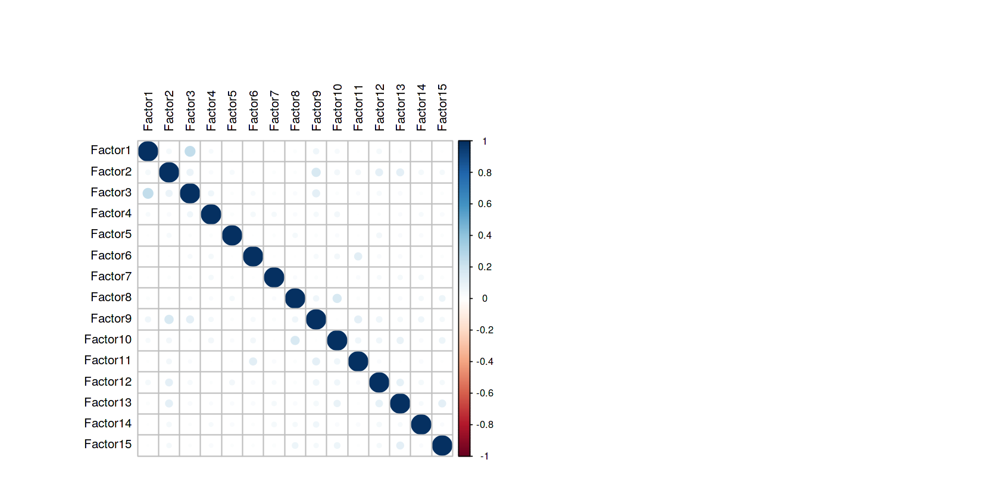

In [7]:
options(repr.plot.width = 14, repr.plot.height = 7)

par(mfrow = c(1,2))
MOFA2::plot_factor_cor(sortedMOFA)
# MOFA2::plot_factor_cor(unsortedMOFA)

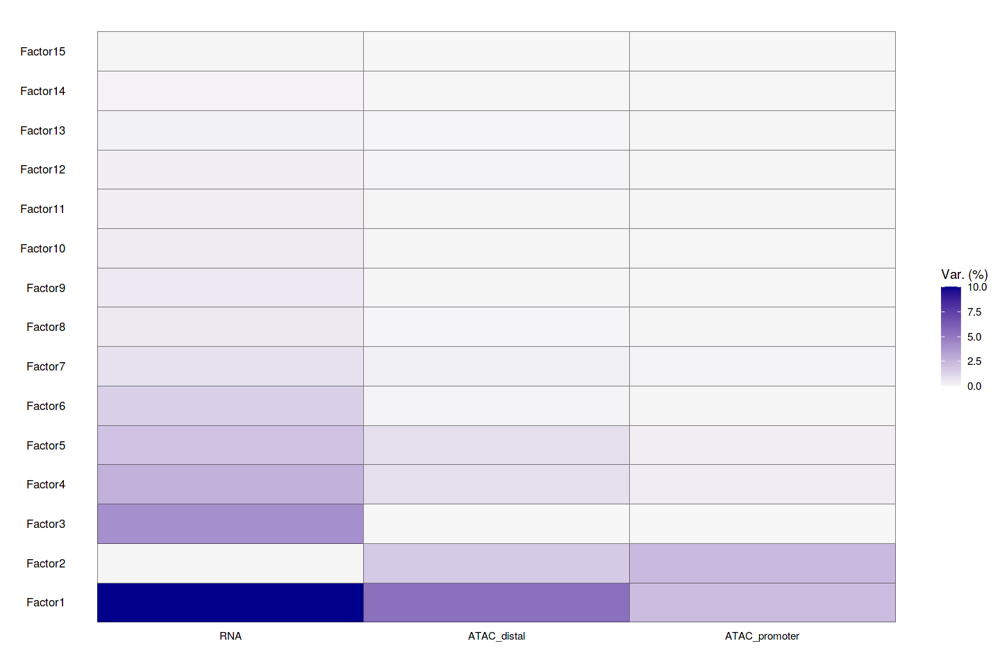

In [8]:
options(repr.plot.width = 12, repr.plot.height = 8)

 MOFA2::plot_variance_explained(sortedMOFA, max_r2 = 10)
# b    <- MOFA2::plot_variance_explained(unsortedMOFA, max_r2 = 10)
# plot <- cowplot::plot_grid(a, b, labels = "AUTO", align = "h")


# title   <- ggdraw() + draw_label(
#     "Variance explained per factor",
#     fontface = 'bold') 

# caption <- ggdraw() + draw_label(
#     "A) Sorted PBMC data. B: unsorted PBMC data.",
#     fontface = 'italic') 

# cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.1))

Scale for 'y' is already present. Adding another scale for 'y', which will
replace the existing scale.



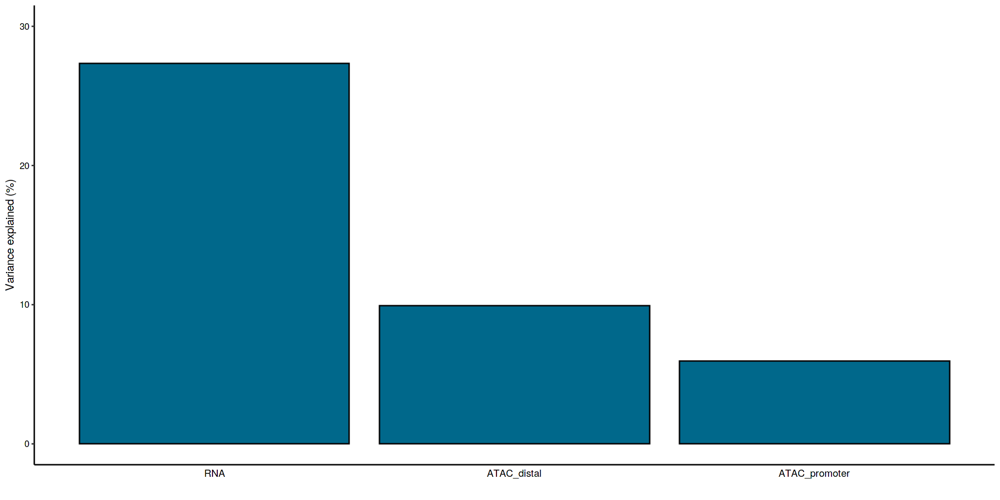

In [9]:
options(repr.plot.width = 14, repr.plot.height = 7)
# suppressMessages({
 MOFA2::plot_variance_explained(sortedMOFA,
                                 plot_total = TRUE)[[2]] +
         ylim(0, 30)

#     b <- MOFA2::plot_variance_explained(unsortedMOFA,
#                                  plot_total = TRUE)[[2]] +
#          ylim(0, 30)
#     plot <- cowplot::plot_grid(a, b, labels = "AUTO", align = "h")


#     title   <- ggdraw() + draw_label(
#         "Total variance explained per group",
#         fontface = 'bold') 

#     caption <- ggdraw() + draw_label(
#         "A) Sorted PBMC data. B: unsorted PBMC data.",
#         fontface = 'italic') 

#     cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.1))
# })

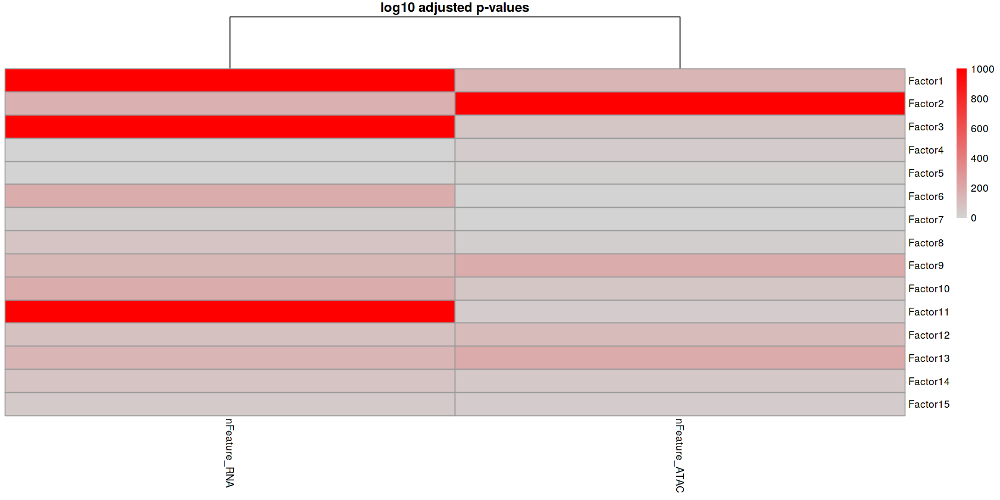

In [10]:

MOFA2::correlate_factors_with_covariates(sortedMOFA, 
  covariates = c("nFeature_RNA","nFeature_ATAC")
  )


Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



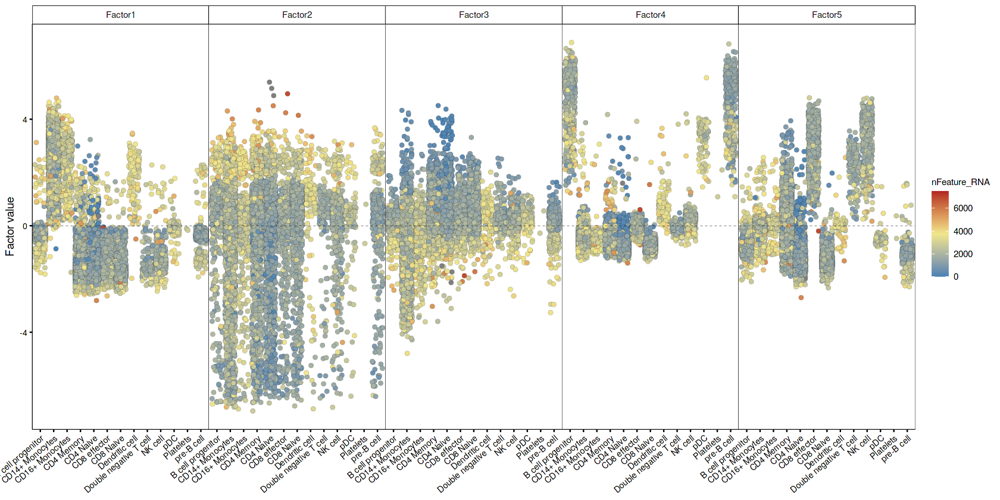

In [11]:
plot_factor(sortedMOFA, factors=c(1,2, 3, 4, 5), group_by = "celltype", color_by="nFeature_RNA") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  ) + scale_fill_gradientn(limits = c(0,7500),
  colours=c("steelblue", "khaki", "firebrick"))

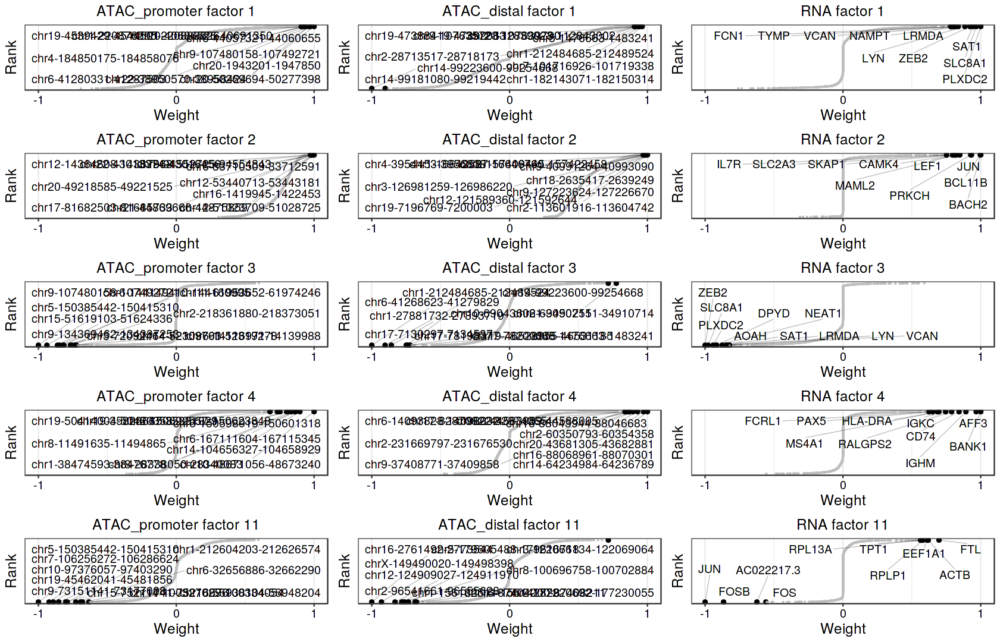

In [30]:
options(repr.plot.width = 14, repr.plot.height = 9)

plot_grid(
plot_weights(sortedMOFA, 
  view = "ATAC_promoter", 
  factors = 1, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_promoter factor 1"),
plot_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 1, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_distal factor 1"),
plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 1, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("RNA factor 1"),
plot_weights(sortedMOFA, 
  view = "ATAC_promoter", 
  factors = 2, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_promoter factor 2"),
plot_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 2, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_distal factor 2"),
plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 2, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("RNA factor 2"),
plot_weights(sortedMOFA, 
  view = "ATAC_promoter", 
  factors = 3, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_promoter factor 3"),
plot_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 3, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_distal factor 3"),
plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 3, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("RNA factor 3"),plot_weights(sortedMOFA, 
  view = "ATAC_promoter", 
  factors = 4, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_promoter factor 4"),
plot_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 4, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_distal factor 4"),
plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 4, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("RNA factor 4"),plot_weights(sortedMOFA, 
  view = "ATAC_promoter", 
  factors = 11, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_promoter factor 11"),
plot_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 11, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("ATAC_distal factor 11"),
plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 11, 
  nfeatures = 10, 
  text_size = 4
) + ggtitle("RNA factor 11"), ncol = 3)

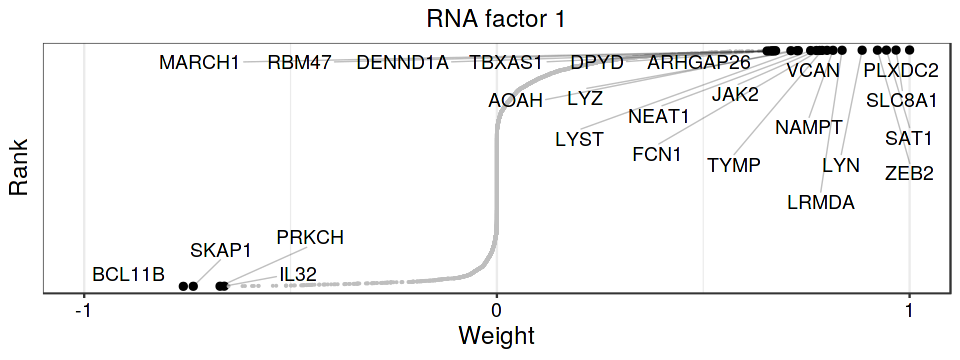

In [34]:
options(repr.plot.width = 8, repr.plot.height = 3)
plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 1, 
  nfeatures = 25, 
  text_size = 4
) + ggtitle("RNA factor 1")

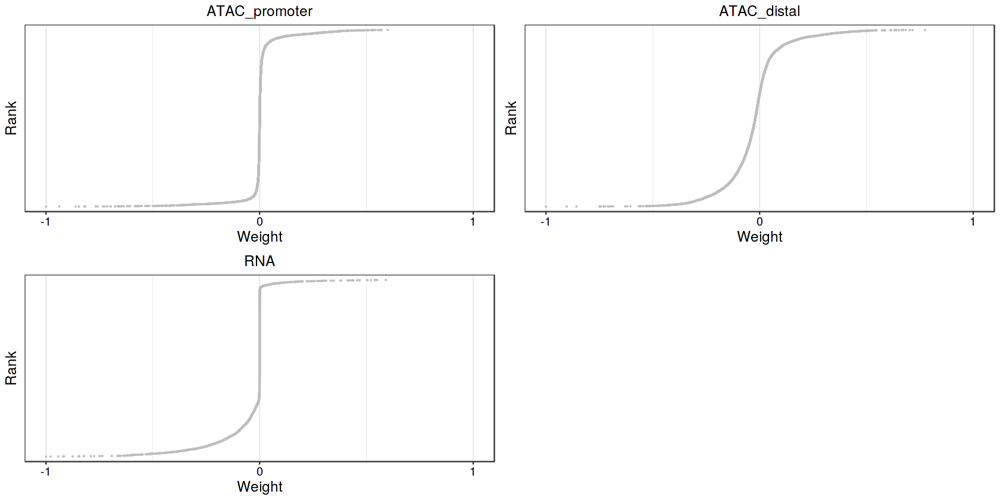

In [22]:
plot_grid(
plot_weights(sortedMOFA, 
  view = "ATAC_promoter", 
  factors = 3, 
  nfeatures = 0, 
  text_size = 4
) + ggtitle("ATAC_promoter"),
plot_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 3, 
  nfeatures = 0, 
  text_size = 4
) + ggtitle("ATAC_distal"),
plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 3, 
  nfeatures = 0, 
  text_size = 4
) + ggtitle("RNA"))

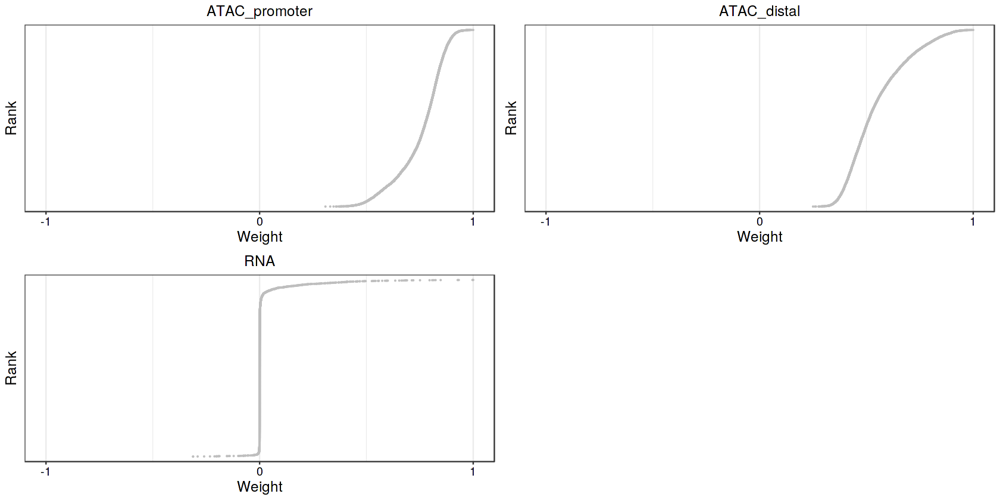

In [23]:
plot_grid(
plot_weights(sortedMOFA, 
  view = "ATAC_promoter", 
  factors = 2, 
  nfeatures = 0, 
  text_size = 4
) + ggtitle("ATAC_promoter"),
plot_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 2, 
  nfeatures = 0, 
  text_size = 4
) + ggtitle("ATAC_distal"),
plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 2, 
  nfeatures = 0, 
  text_size = 4
) + ggtitle("RNA"))

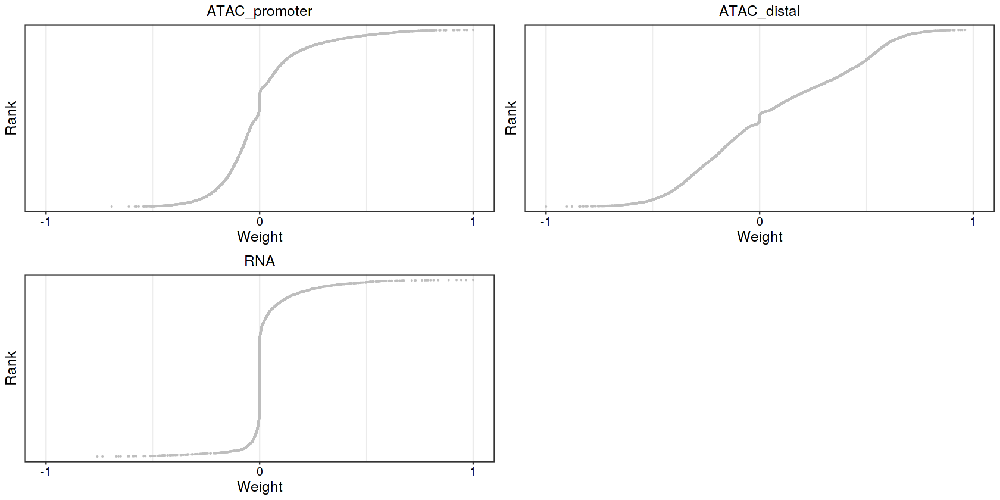

In [24]:
plot_grid(
plot_weights(sortedMOFA, 
  view = "ATAC_promoter", 
  factors = 1, 
  nfeatures = 0, 
  text_size = 4
) + ggtitle("ATAC_promoter"),
plot_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 1, 
  nfeatures = 0, 
  text_size = 4
) + ggtitle("ATAC_distal"),
plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 1, 
  nfeatures = 0, 
  text_size = 4
) + ggtitle("RNA"))

Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



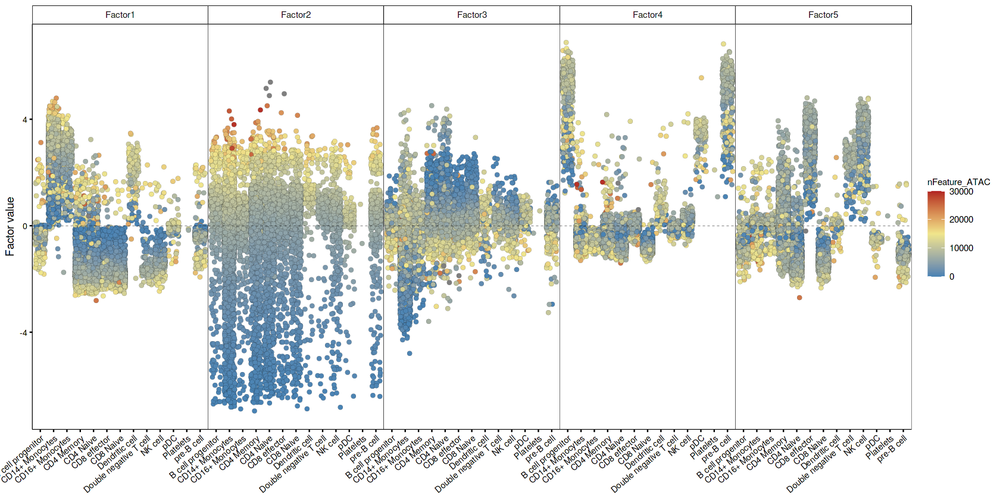

In [13]:
plot_factor(sortedMOFA, factors=c(1,2, 3, 4, 5), group_by = "celltype", color_by="nFeature_ATAC") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  ) + scale_fill_gradientn(limits = c(0,30000),
  colours=c("steelblue", "khaki", "firebrick"))

In [14]:
MOFA2::correlate_factors_with_covariates(unsortedMOFA,
  covariates = c("nFeature_RNA","nFeature_ATAC")
  )

ERROR: Error in is(object, "MOFA"): object 'unsortedMOFA' not found


In [ ]:
suppressWarnings({
    a <- plot_factor(sortedMOFA,
                     factors=4,
                     group_by = "celltype",
                     color_by = "broad_celltype") +
      theme(
        axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
      )
    b <- plot_factor(unsortedMOFA, ,
                     factors=4,
                     group_by = "celltype",
                     color_by = "broad_celltype") +
      theme(
        axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
      )

    plot <- cowplot::plot_grid(a, b, ncol = 1)
    title   <- ggdraw() + draw_label(
        "Factor plot",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "top row) sorted PBMC data, factor 4. bottom row) unsorted PBMC data, factor 4. Both rows display factor values per cell type.",
        fontface = 'italic') 


    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
})

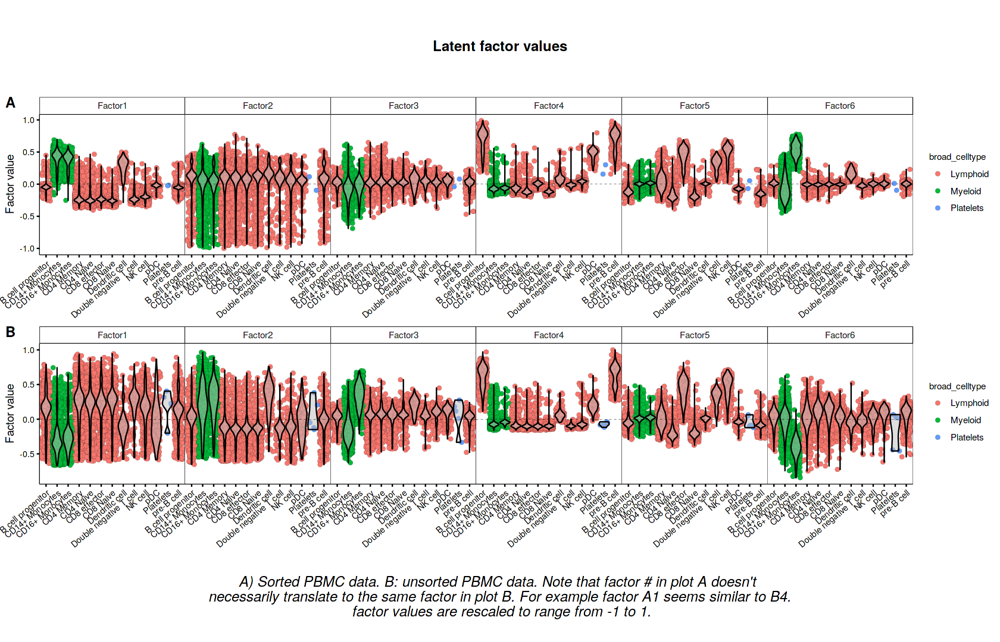

In [15]:
options(repr.plot.width = 14, repr.plot.height = 9)

a <- MOFA2::plot_factor(sortedMOFA,
                        factors=c(1,2, 3, 4, 5),
                        group_by = "celltype",
                        color_by = "broad_celltype",
                        add_violin = TRUE,
                        scale = TRUE) +
  theme(axis.text.x = element_text(color="black",
                                   angle=40,
                                   vjust=1,
                                   hjust=1))
b <- MOFA2::plot_factor(unsortedMOFA,
                        factors=c(1,2, 3, 4, 5),
                        group_by = "celltype",
                        color_by = "broad_celltype",
                        add_violin = TRUE,
                        scale = TRUE) +
  theme(axis.text.x = element_text(color="black",
                                   angle=40,
                                   vjust=1,
                                   hjust=1))
plot <- cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

title   <- ggdraw() + draw_label(
    "Latent factor values 1/3",
    fontface = 'bold') 

caption <- ggdraw() + draw_label(
    "A) Sorted PBMC data. B: unsorted PBMC data. Note that factor # in plot A doesn't \n necessarily translate to the same factor in plot B. Factor values are rescaled to range from -1 to 1.",
    fontface = 'italic') 

cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))

# factor 4 of sorted and 3 of unstored seem to select for the same cell types
# factor 1 of sorted and 4 of unstored might do as well.
# factor 3 of sorted and 5 of unstored might do as well.

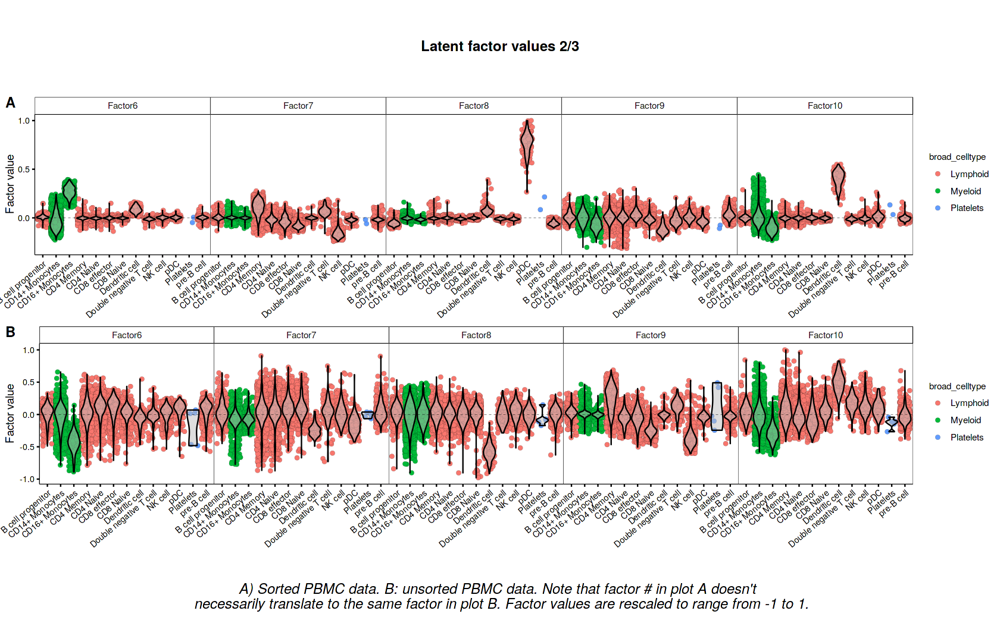

In [16]:
options(repr.plot.width = 14, repr.plot.height = 9)

a <- MOFA2::plot_factor(sortedMOFA,
                        factors=c(6, 7, 8, 9, 10),
                        group_by = "celltype",
                        color_by = "broad_celltype",
                        add_violin = TRUE,
                        scale = TRUE) +
  theme(axis.text.x = element_text(color="black",
                                   angle=40,
                                   vjust=1,
                                   hjust=1))
b <- MOFA2::plot_factor(unsortedMOFA,
                        factors=c(6, 7, 8, 9, 10),
                        group_by = "celltype",
                        color_by = "broad_celltype",
                        add_violin = TRUE,
                        scale = TRUE) +
  theme(axis.text.x = element_text(color="black",
                                   angle=40,
                                   vjust=1,
                                   hjust=1))
plot <- cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

title   <- ggdraw() + draw_label(
    "Latent factor values 2/3",
    fontface = 'bold') 

caption <- ggdraw() + draw_label(
    "A) Sorted PBMC data. B: unsorted PBMC data. Note that factor # in plot A doesn't \n necessarily translate to the same factor in plot B. Factor values are rescaled to range from -1 to 1.",
    fontface = 'italic') 

cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))

# factor 4 of sorted and 3 of unstored seem to select for the same cell types
# factor 1 of sorted and 4 of unstored might do as well.
# factor 3 of sorted and 5 of unstored might do as well.

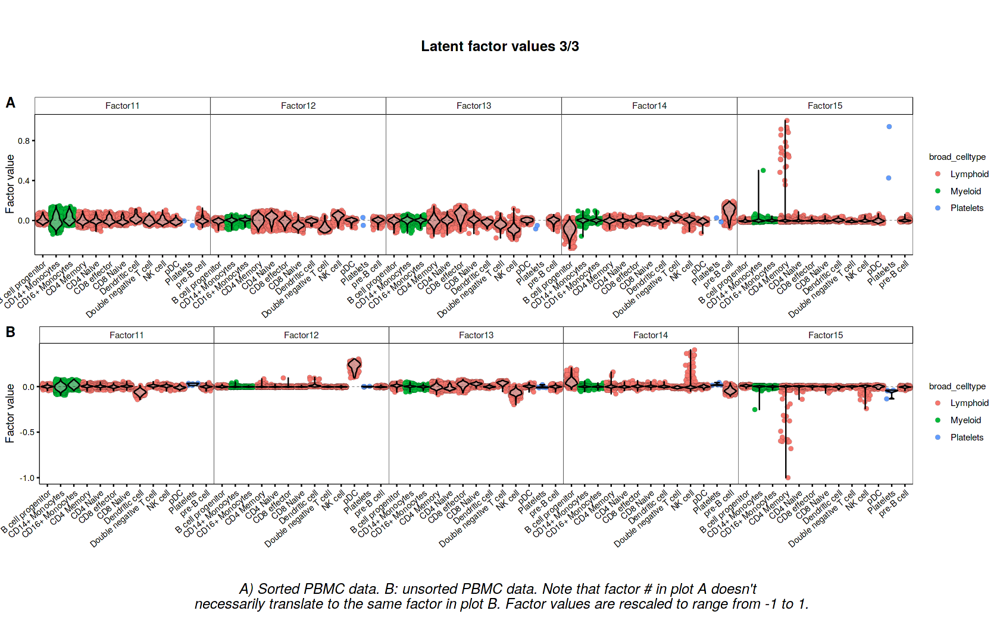

In [17]:
options(repr.plot.width = 14, repr.plot.height = 9)

a <- MOFA2::plot_factor(sortedMOFA,
                        factors=c(11, 12, 13, 14, 15),
                        group_by = "celltype",
                        color_by = "broad_celltype",
                        add_violin = TRUE,
                        scale = TRUE) +
  theme(axis.text.x = element_text(color="black",
                                   angle=40,
                                   vjust=1,
                                   hjust=1))
b <- MOFA2::plot_factor(unsortedMOFA,
                        factors=c(11, 12, 13, 14, 15),
                        group_by = "celltype",
                        color_by = "broad_celltype",
                        add_violin = TRUE,
                        scale = TRUE) +
  theme(axis.text.x = element_text(color="black",
                                   angle=40,
                                   vjust=1,
                                   hjust=1))
plot <- cowplot::plot_grid(a, b, labels = "AUTO", ncol = 1)

title   <- ggdraw() + draw_label(
    "Latent factor values 3/3",
    fontface = 'bold') 

caption <- ggdraw() + draw_label(
    "A) Sorted PBMC data. B: unsorted PBMC data. Note that factor # in plot A doesn't \n necessarily translate to the same factor in plot B. Factor values are rescaled to range from -1 to 1.",
    fontface = 'italic') 

cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))


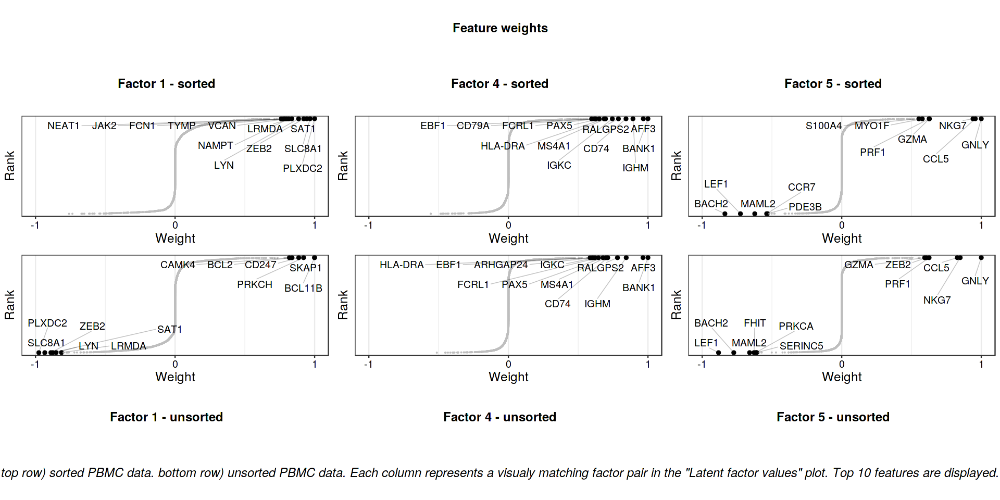

In [26]:
options(repr.plot.width = 16, repr.plot.height = 8)

a <- plot_weights(sortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 1)
b <- plot_weights(sortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 4)
c <- plot_weights(sortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 5)


g <- plot_weights(unsortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 1)
h <- plot_weights(unsortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 4)
i <- plot_weights(unsortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 5)


plot    <- cowplot::plot_grid(a, b, c, g, h, i, nrow = 2)

title   <- ggdraw() + draw_label(
    "Feature weights",
    fontface = 'bold') 

top_labels <- plot_grid(
    ggdraw() + draw_label("Factor 1 - sorted", fontface = 'bold'),
    ggdraw() + draw_label("Factor 4 - sorted", fontface = 'bold'),
    ggdraw() + draw_label("Factor 5 - sorted", fontface = 'bold'),
    nrow = 1
)

bottom_labels <- plot_grid(
    ggdraw() + draw_label("Factor 1 - unsorted", fontface = 'bold'),
    ggdraw() + draw_label("Factor 4 - unsorted", fontface = 'bold'),
    ggdraw() + draw_label("Factor 5 - unsorted", fontface = 'bold'),
    nrow = 1
)


caption <- ggdraw() + draw_label(
    "top row) sorted PBMC data. bottom row) unsorted PBMC data. Each column represents a visualy matching factor pair in the \"Latent factor values\" plot. Top 10 features are displayed.",
    fontface = 'italic') 

cowplot::plot_grid(title, top_labels, plot, bottom_labels, caption, ncol = 1, rel_heights = c(0.2, 0.2, 1, 0.2, 0.2))

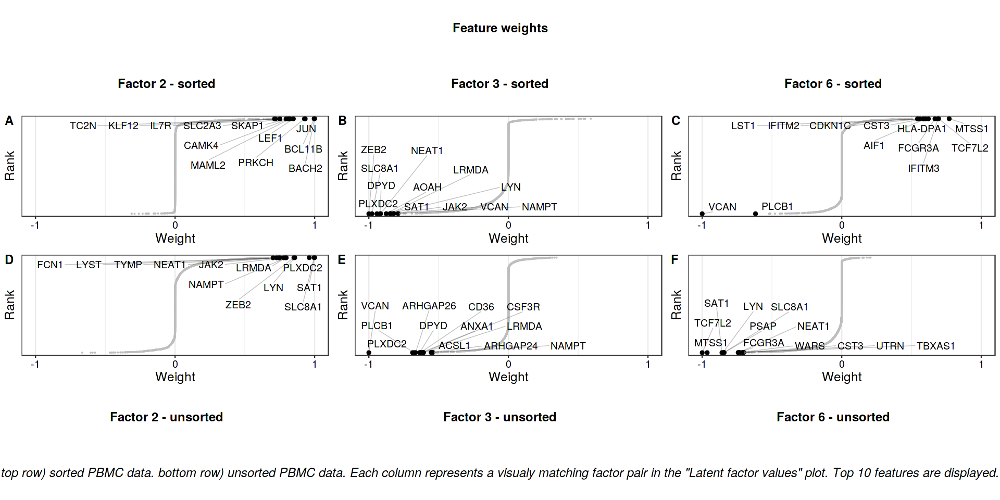

In [28]:
options(repr.plot.width = 16, repr.plot.height = 8)

a <- plot_weights(sortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 2)
b <- plot_weights(sortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 3)
c <- plot_weights(sortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 6)


g <- plot_weights(unsortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 2)
h <- plot_weights(unsortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 3)
i <- plot_weights(unsortedMOFA, 
  view = "RNA", nfeatures = 12, text_size = 4,
  factors = 6)


plot    <- cowplot::plot_grid(a, b, c, g, h, i, labels = "AUTO", nrow = 2)

title   <- ggdraw() + draw_label(
    "Feature weights",
    fontface = 'bold') 

top_labels <- plot_grid(
    ggdraw() + draw_label("Factor 2 - sorted", fontface = 'bold'),
    ggdraw() + draw_label("Factor 3 - sorted", fontface = 'bold'),
    ggdraw() + draw_label("Factor 6 - sorted", fontface = 'bold'),
    nrow = 1
)

bottom_labels <- plot_grid(
    ggdraw() + draw_label("Factor 2 - unsorted", fontface = 'bold'),
    ggdraw() + draw_label("Factor 3 - unsorted", fontface = 'bold'),
    ggdraw() + draw_label("Factor 6 - unsorted", fontface = 'bold'),
    nrow = 1
)


caption <- ggdraw() + draw_label(
    "top row) sorted PBMC data. bottom row) unsorted PBMC data. Each column represents a visualy matching factor pair in the \"Latent factor values\" plot. Top 10 features are displayed.",
    fontface = 'italic') 

cowplot::plot_grid(title, top_labels, plot, bottom_labels, caption, ncol = 1, rel_heights = c(0.2, 0.2, 1, 0.2, 0.2))



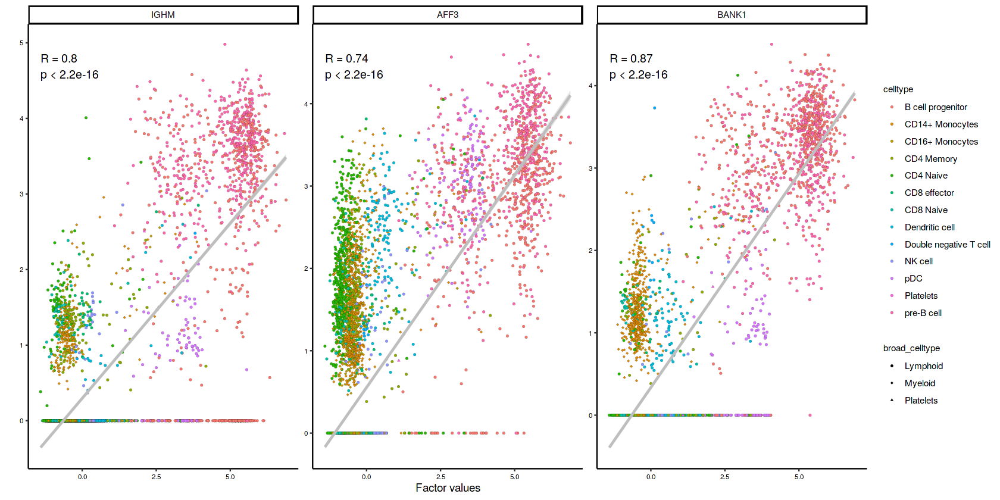

In [54]:
# factor 4 of sorted and 3 of unstored seem to selecto for the sam cell
plot_data_scatter(sortedMOFA, 
  view = "RNA", 
  factor = 4, 
  features = 3,
  color_by = "celltype",
  shape_by = "broad_celltype",
  add_lm = T,
  dot_size = 1
)
# b <- plot_data_scatter(unsortedMOFA, 
#   view = "RNA", 
#   factor = 4, 
#   features = 3,
#   color_by = "celltype",
#   shape_by = "broad_celltype",
#   add_lm = T,
#   dot_size = 1
# )
# title   <- ggdraw() + draw_label(
#     "Top 3 Features of sorted factor 4 and unsorted factor 4",
#     fontface = 'bold') 

# caption <- ggdraw() + draw_label(
#     "top row) Top 3 features for factor 4 of sorted PBMC data. bottom row) Top 3 features for factor 4 of unsorted PBMC data. \n Note that factor 4 of the sorted and unsorted data happen to overlap. This is not true for all factors with the same number.",
#     fontface = 'italic') 

# plot    <- cowplot::plot_grid(a, b, nrow = 2)

# cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))

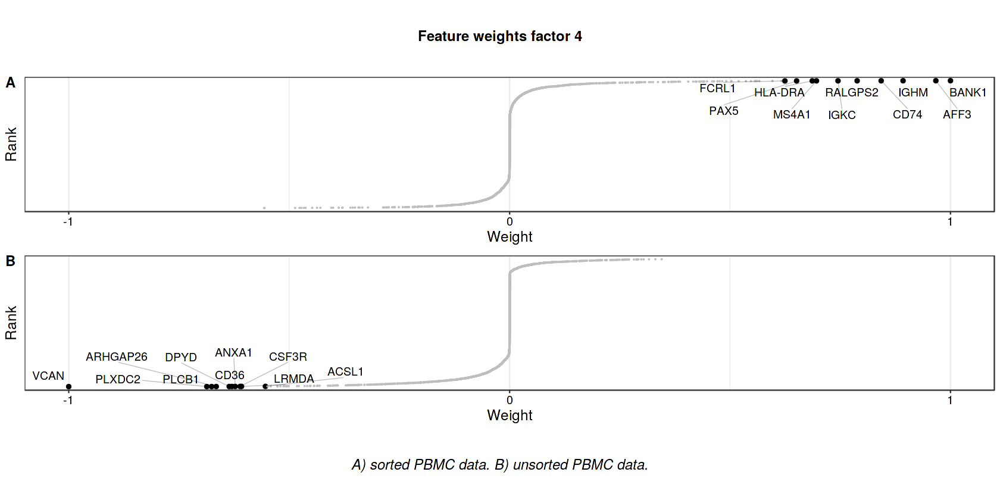

In [45]:
a <- plot_weights(sortedMOFA, 
  view = "RNA", 
  factors = 4, 
  nfeatures = 10, 
  text_size = 4
)
b <- plot_weights(unsortedMOFA, 
  view = "RNA", 
  factors = 3, 
  nfeatures = 10, 
  text_size = 4
)
title   <- ggdraw() + draw_label(
    "Feature weights factor 4",
    fontface = 'bold') 
caption <- ggdraw() + draw_label(
    "A) sorted PBMC data. B) unsorted PBMC data.",
    fontface = 'italic')

plot <- cowplot::plot_grid( a, b, labels = "AUTO", ncol = 1)
cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))

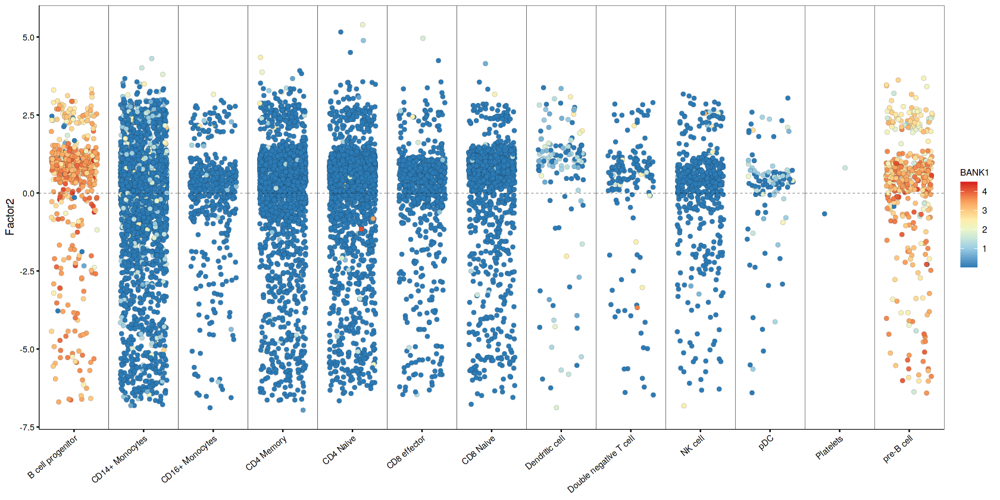

In [55]:
plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="BANK1") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
# b <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="BANK1") +
#   theme(
#     axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
#   )

# title   <- ggdraw() + draw_label(
#     "Feature weights factor 4 - colored by BANK1 expression levels",
#     fontface = 'bold') 
# caption <- ggdraw() + draw_label(
#     "A) sorted PBMC data. B) unsorted PBMC data.",
#     fontface = 'italic')

# plot <- cowplot::plot_grid( a, b, labels = "AUTO", ncol = 1)
# cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))


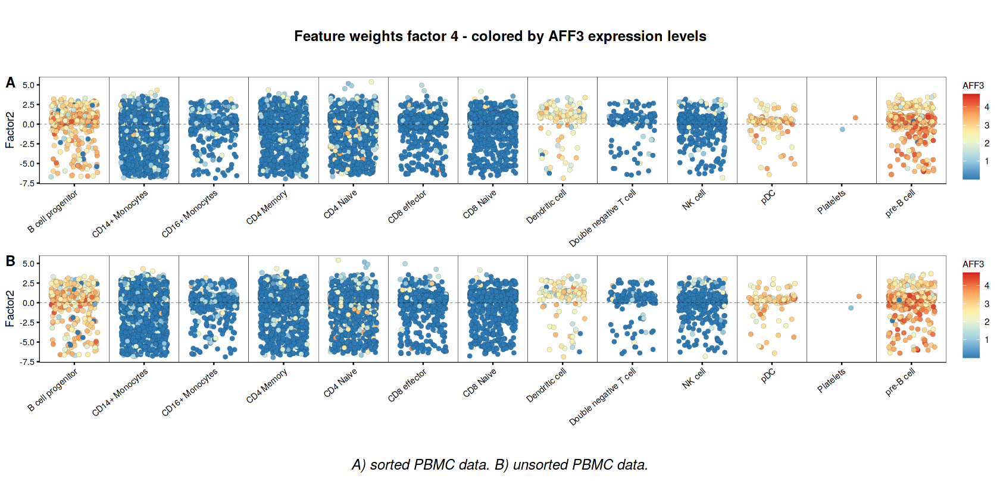

In [47]:
a <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="AFF3") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
b <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="AFF3") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
title   <- ggdraw() + draw_label(
    "Feature weights factor 4 - colored by AFF3 expression levels",
    fontface = 'bold') 
caption <- ggdraw() + draw_label(
    "A) sorted PBMC data. B) unsorted PBMC data.",
    fontface = 'italic')

plot <- cowplot::plot_grid( a, b, labels = "AUTO", ncol = 1)
cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))

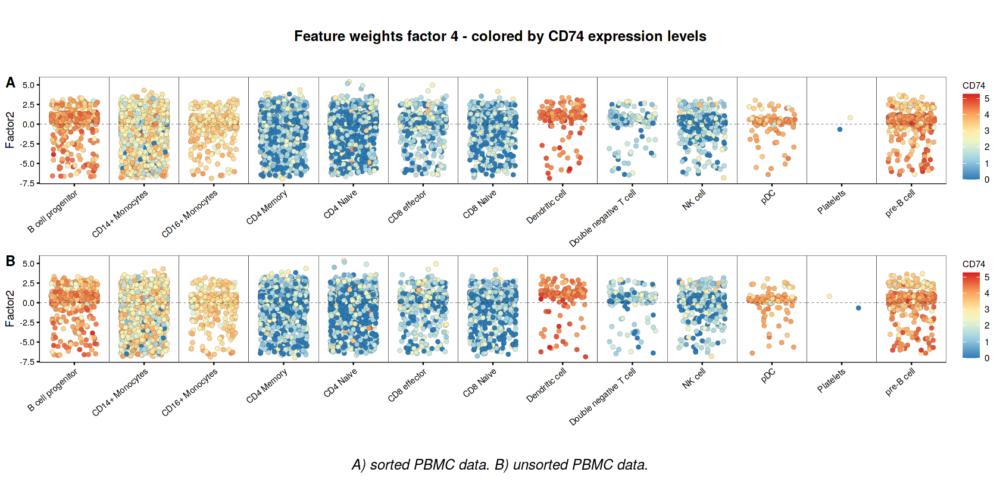

In [48]:
a <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="CD74") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
b <- plot_factor(sortedMOFA, factors=2, group_by = "celltype", color_by="CD74") +
  theme(
    axis.text.x = element_text(color="black", angle=40, vjust=1, hjust=1)
  )
title   <- ggdraw() + draw_label(
    "Feature weights factor 4 - colored by CD74 expression levels",
    fontface = 'bold') 
caption <- ggdraw() + draw_label(
    "A) sorted PBMC data. B) unsorted PBMC data.",
    fontface = 'italic')

plot <- cowplot::plot_grid( a, b, labels = "AUTO", ncol = 1)
cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))

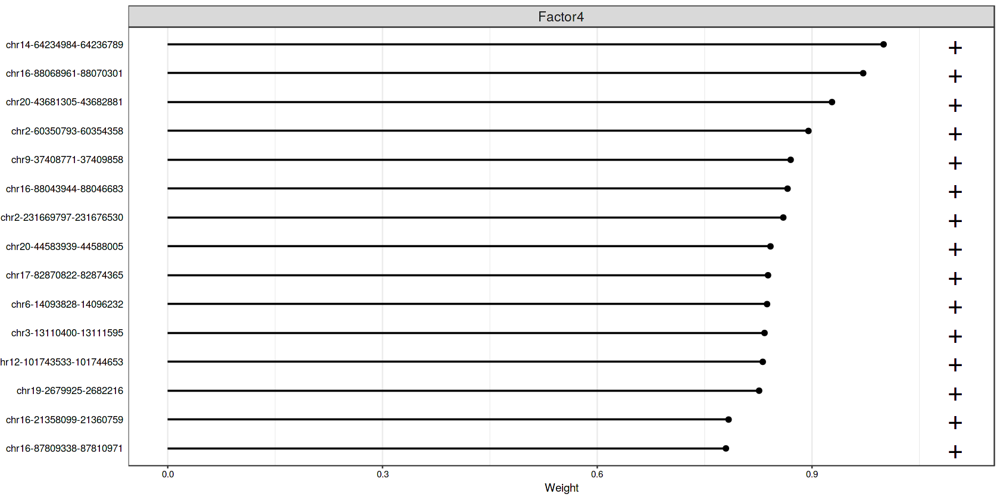

In [56]:
# less usefull?
plot_top_weights(sortedMOFA, 
  view = "ATAC_distal", 
  factors = 4, 
  sign = "positive",
  nfeatures = 15,
)
# b <- plot_top_weights(unsortedMOFA, 
#   view = "ATAC_distal", 
#   factors = 4, 
#   sign = "positive",
#   nfeatures = 15,
# )

# plot <- cowplot::plot_grid(a, b, labels = "AUTO", nrow = 1)

# title   <- ggdraw() + draw_label(
#     "Top 15 distal peaks in ATAC data",
#     fontface = 'bold') 

# caption <- ggdraw() + draw_label(
#     "A) sorted PBMC data. B) unsorted PBMC data. Note that peak locations don't overlap between A and B \n but some peaks do overlap, for example chr9-37408771-37409858 and chr9-37408905-37409792",
#     fontface = 'italic') 

# cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))

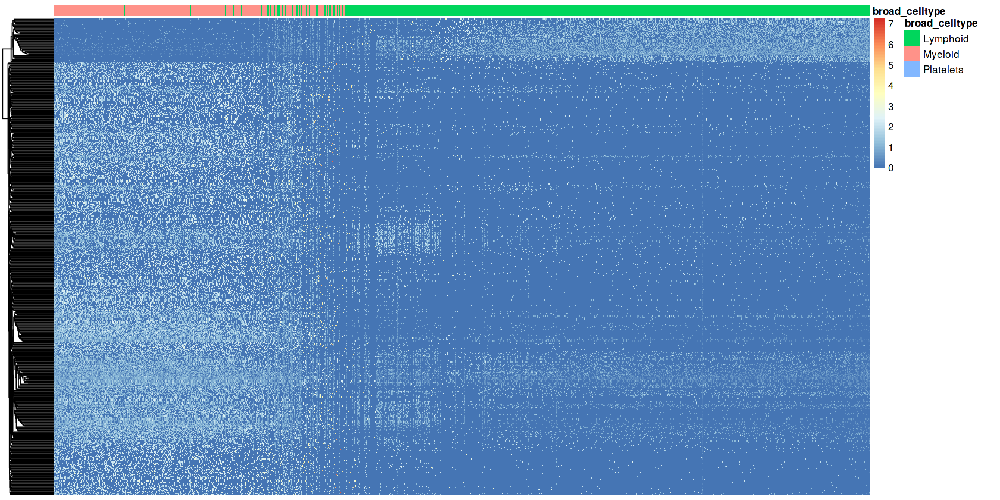

In [64]:
plot_data_heatmap(sortedMOFA, 
  view = "ATAC_promoter", 
  factor = 1, 
  features = 500,
  show_rownames = F, show_colnames = F, 
  cluster_rows = T, cluster_cols = F,
  annotation_samples = "broad_celltype"
) 

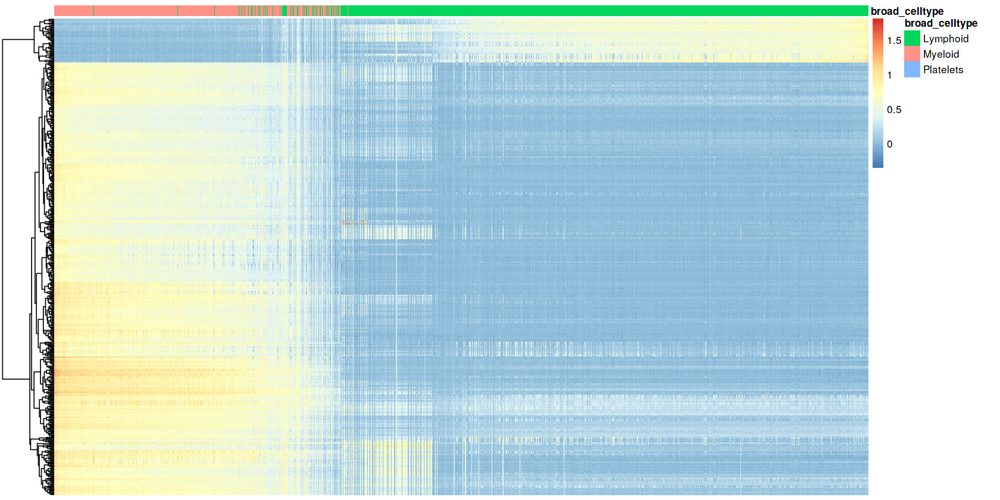

In [60]:
plot_data_heatmap(sortedMOFA, 
  view = "ATAC_promoter", 
  factor = 1, 
  features = 500,
  show_rownames = F, show_colnames = F, 
  cluster_rows = T, cluster_cols = F,
  annotation_samples = "broad_celltype",
  denoise = TRUE
)

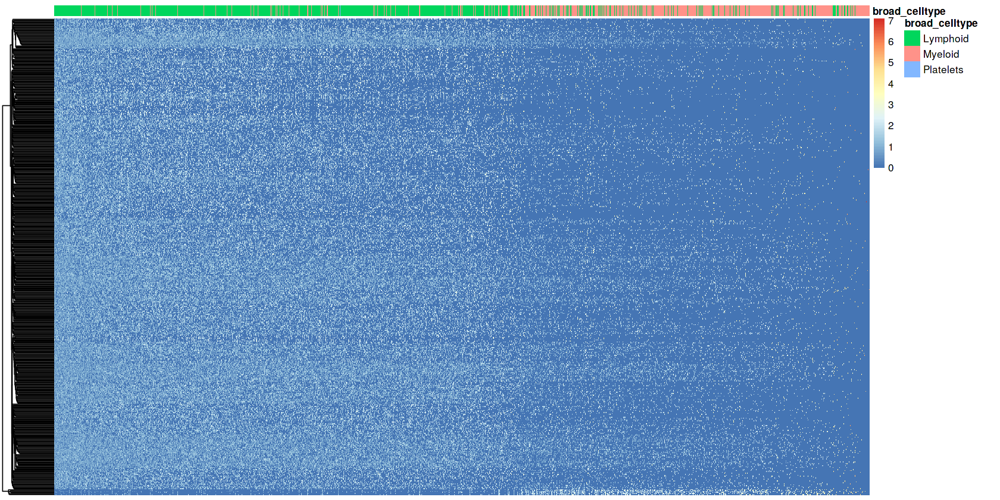

In [61]:
plot_data_heatmap(unsortedMOFA, 
  view = "ATAC_promoter", 
  factor = 1, 
  features = 500,
  show_rownames = F, show_colnames = F, 
  cluster_rows = T, cluster_cols = F,
  annotation_samples = "broad_celltype"
)

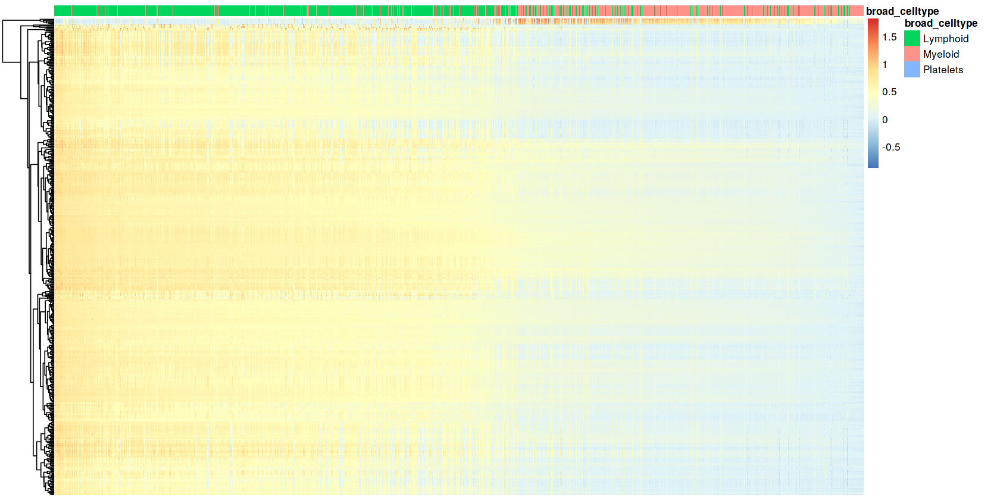

In [62]:
plot_data_heatmap(unsortedMOFA, 
  view = "ATAC_promoter", 
  factor = 1, 
  features = 500,
  show_rownames = F, show_colnames = F, 
  cluster_rows = T, cluster_cols = F,
  annotation_samples = "broad_celltype",
  denoise = TRUE
)

In [79]:
# suppressMessages({
    factors <- 1:get_dimensions(sortedMOFA)[["K"]]

    mofa <- run_umap(sortedMOFA, 
      factors = factors, 
      n_neighbors = 8,  
      min_dist = 0.30
    )

factorz <- c(1,3,4,5,6,7,8,9,10,12,13,14,15)

    mofa <- run_umap(sortedMOFA, 
      factors = factorz, 
      n_neighbors = 8,  
      min_dist = 0.30
    )

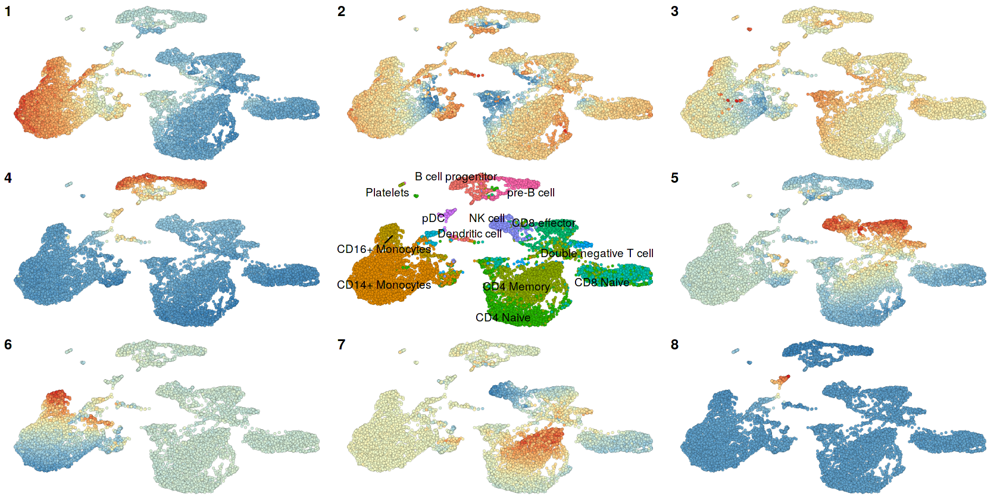

In [80]:
plot_grid(
        plot_dimred(mofa, 
      method = "UMAP", 
      color_by = "Factor1", 
      label = TRUE, 
      stroke=0.05, 
      dot_size = 1, 
      legend = FALSE
    ) + theme_void() + theme(legend.position="none"),
    plot_dimred(mofa, 
      method = "UMAP", 
      color_by = "Factor2", 
      label = TRUE, 
      stroke=0.05, 
      dot_size = 1, 
      legend = FALSE
    ) + theme_void() + theme(legend.position="none"),
    plot_dimred(mofa, 
      method = "UMAP", 
      color_by = "Factor3", 
      label = TRUE, 
      stroke=0.05, 
      dot_size = 1, 
      legend = FALSE
    ) + theme_void() + theme(legend.position="none"),
    plot_dimred(mofa, 
      method = "UMAP", 
      color_by = "Factor4", 
      label = TRUE, 
      stroke=0.05, 
      dot_size = 1, 
      legend = FALSE
    ) + theme_void() + theme(legend.position="none"),
    plot_dimred(mofa, 
      method = "UMAP", 
      color_by = "celltype", 
      label = TRUE, 
      stroke=0.05, 
      dot_size = 1, 
      legend = FALSE
    ) + theme_void() + theme(legend.position="none"),
    plot_dimred(mofa, 
      method = "UMAP", 
      color_by = "Factor5", 
      label = TRUE, 
      stroke=0.05, 
      dot_size = 1, 
      legend = FALSE
    ) + theme_void() + theme(legend.position="none"),
    plot_dimred(mofa, 
      method = "UMAP", 
      color_by = "Factor6", 
      label = TRUE, 
      stroke=0.05, 
      dot_size = 1, 
      legend = FALSE
    ) + theme_void() + theme(legend.position="none"),
    plot_dimred(mofa, 
      method = "UMAP", 
      color_by = "Factor7", 
      label = TRUE, 
      stroke=0.05, 
      dot_size = 1, 
      legend = FALSE
    ) + theme_void() + theme(legend.position="none"),
    plot_dimred(mofa, 
      method = "UMAP", 
      color_by = "Factor8", 
      label = TRUE, 
      stroke=0.05, 
      dot_size = 1, 
      legend = FALSE
    ) + theme_void() + theme(legend.position="none"),
    labels = c( "1", "2", "3", "4","", "5", "6", "7", "8"))
#     factors <- 1:get_dimensions(unsortedMOFA)[["K"]]

#     mofa <- run_umap(unsortedMOFA, 
#       factors = factors, 
#       n_neighbors = 8,  
#       min_dist = 0.30
#     )

#     b <- plot_dimred(unsortedMOFA, 
#       method = "UMAP", 
#       color_by = "celltype", 
#       label = TRUE, 
#       stroke=0.05, 
#       dot_size = 1, 
#       legend = FALSE
#     ) + theme_void() + theme(legend.position="none")

#     plot <- cowplot::plot_grid(a, b, labels = "AUTO", nrow = 1)

#     title   <- ggdraw() + draw_label(
#         "Dimensionality reduction based on MOFA factors",
#         fontface = 'bold') 

#     caption <- ggdraw() + draw_label(
#         "A) sorted PBMC data. B) unsorted PBMC data.",
#         fontface = 'italic') 

#     cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
# })

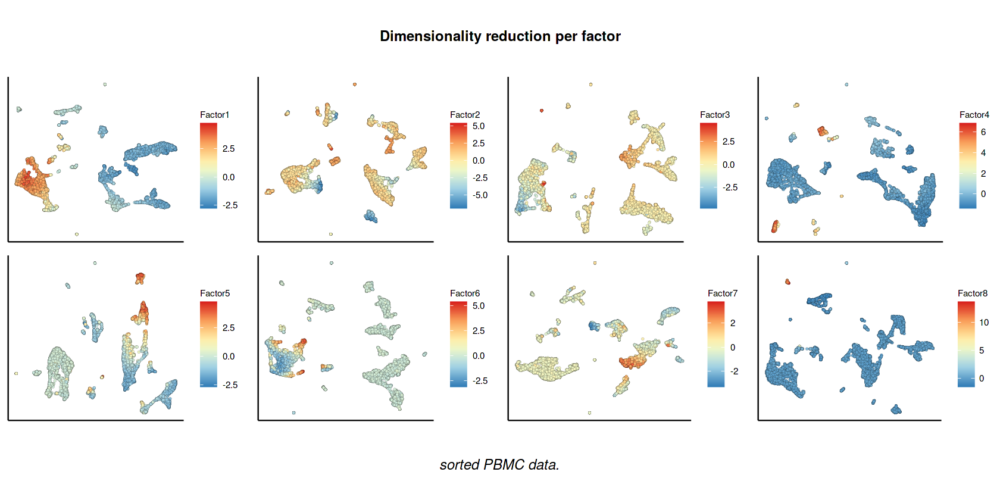

In [78]:
suppressMessages({
    a <- plot_dimred(sortedMOFA, 
    method = "UMAP", 
    color_by = "Factor1", 
    stroke = 0.05, 
    dot_size = 1
    )
    b <- plot_dimred(sortedMOFA, 
    method = "UMAP", 
    color_by = "Factor2", 
    stroke = 0.05, 
    dot_size = 1
    )
    c <- plot_dimred(sortedMOFA, 
    method = "UMAP", 
    color_by = "Factor3", 
    stroke = 0.05, 
    dot_size = 1
    )
    d <- plot_dimred(sortedMOFA, 
    method = "UMAP", 
    color_by = "Factor4", 
    stroke = 0.05, 
    dot_size = 1
    )
    e <- plot_dimred(sortedMOFA, 
    method = "UMAP", 
    color_by = "Factor5", 
    stroke = 0.05, 
    dot_size = 1
    )
    f <- plot_dimred(sortedMOFA, 
    method = "UMAP", 
    color_by = "Factor6", 
    stroke = 0.05, 
    dot_size = 1
    )
    g <- plot_dimred(sortedMOFA, 
    method = "UMAP", 
    color_by = "Factor7", 
    stroke = 0.05, 
    dot_size = 1
    )
    h <- plot_dimred(sortedMOFA, 
    method = "UMAP", 
    color_by = "Factor8", 
    stroke = 0.05, 
    dot_size = 1
    )
    plot <- cowplot::plot_grid(a, b, c, d, e, f, g, h, nrow = 2)
    title   <- ggdraw() + draw_label(
        "Dimensionality reduction per factor",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "sorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
})

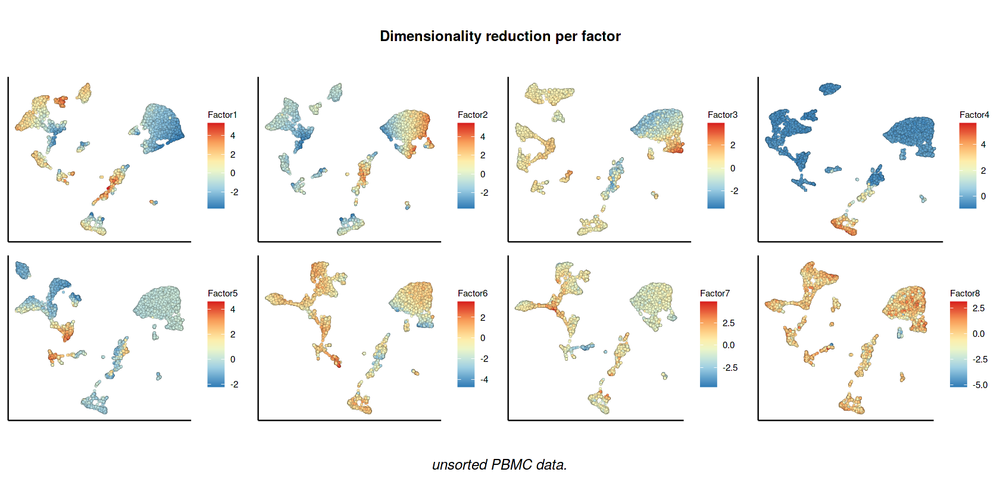

In [69]:
suppressMessages({
    a <- plot_dimred(unsortedMOFA, 
    method = "UMAP", 
    color_by = "Factor1", 
    stroke = 0.05, 
    dot_size = 1
    )
    b <- plot_dimred(unsortedMOFA, 
    method = "UMAP", 
    color_by = "Factor2", 
    stroke = 0.05, 
    dot_size = 1
    )
    c <- plot_dimred(unsortedMOFA, 
    method = "UMAP", 
    color_by = "Factor3", 
    stroke = 0.05, 
    dot_size = 1
    )
    d <- plot_dimred(unsortedMOFA, 
    method = "UMAP", 
    color_by = "Factor4", 
    stroke = 0.05, 
    dot_size = 1
    )
    e <- plot_dimred(unsortedMOFA, 
    method = "UMAP", 
    color_by = "Factor5", 
    stroke = 0.05, 
    dot_size = 1
    )
    f <- plot_dimred(unsortedMOFA, 
    method = "UMAP", 
    color_by = "Factor6", 
    stroke = 0.05, 
    dot_size = 1
    )
    g <- plot_dimred(unsortedMOFA, 
    method = "UMAP", 
    color_by = "Factor7", 
    stroke = 0.05, 
    dot_size = 1
    )
    h <- plot_dimred(unsortedMOFA, 
    method = "UMAP", 
    color_by = "Factor8", 
    stroke = 0.05, 
    dot_size = 1
    )
    plot <- cowplot::plot_grid(a, b, c, d, e, f, g, h, nrow = 2)
    title   <- ggdraw() + draw_label(
        "Dimensionality reduction per factor",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "unsorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
})

In [70]:
sortedSeurat <- SetIdent(sortedSeurat, value="celltype")
Ks <- get_dimensions(sortedMOFA)[["K"]]
unsortedSeurat <- SetIdent(unsortedSeurat, value="celltype")
Ku <- get_dimensions(unsortedMOFA)[["K"]]

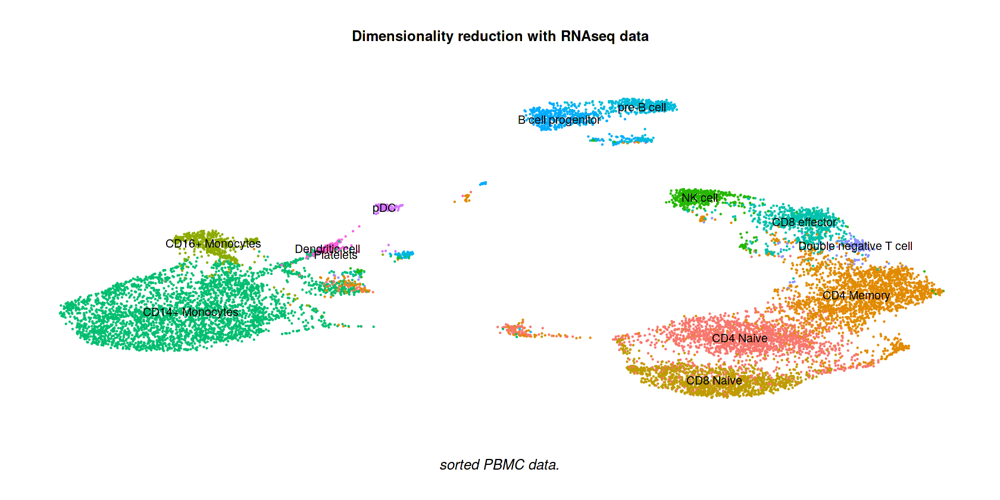

In [86]:
suppressWarnings({
    DefaultAssay(sortedSeurat) <- "RNA"
    sortedSeurat <- RunPCA(sortedSeurat, npcs = Ks, verbose = FALSE)
    sortedSeurat <- RunUMAP(sortedSeurat, reduction = 'pca', dims = 1:Ks, verbose = FALSE)
    plot <- DimPlot(sortedSeurat, label = TRUE, reduction="umap") + 
      NoLegend() + NoAxes() + scale_fill_manual(values=colors)

    title   <- ggdraw() + draw_label(
        "Dimensionality reduction with RNAseq data",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "sorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
})

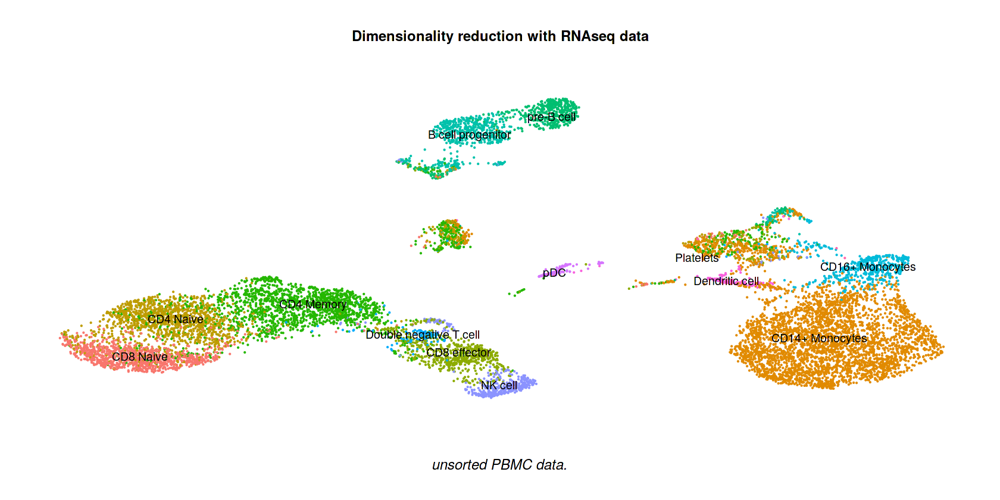

In [85]:
suppressWarnings({
    DefaultAssay(unsortedSeurat) <- "RNA"
    unsortedSeurat <- RunPCA(unsortedSeurat, npcs = Ku, verbose = FALSE)
    unsortedSeurat <- RunUMAP(unsortedSeurat, reduction = 'pca', dims = 1:Ku, verbose = FALSE)
    plot <- DimPlot(unsortedSeurat, label = TRUE, reduction="umap") + 
            NoLegend() + NoAxes() + scale_fill_manual(values=colors)

    title   <- ggdraw() + draw_label(
        "Dimensionality reduction with RNAseq data",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "unsorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
})

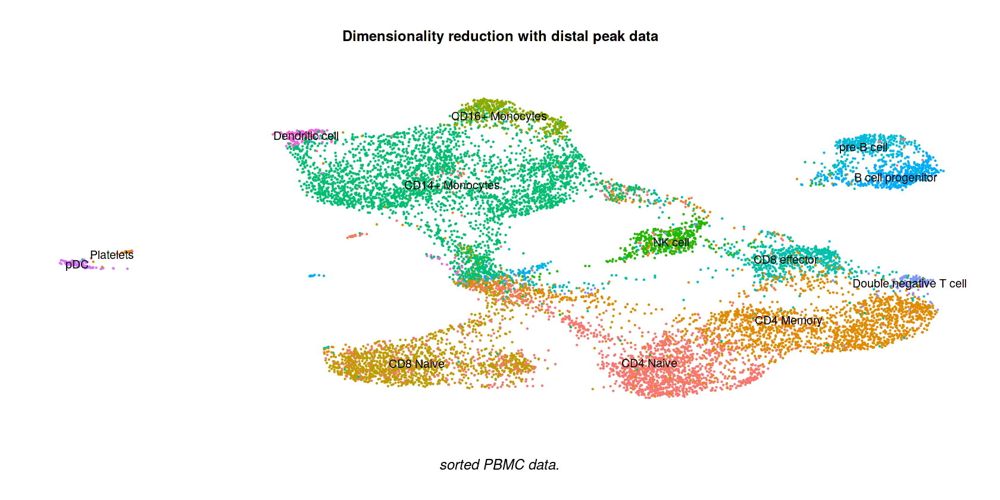

In [84]:
suppressWarnings({
    DefaultAssay(sortedSeurat) <- "ATAC_distal"
    sortedSeurat <- RunSVD(sortedSeurat, n = Ks, verbose = FALSE)
    sortedSeurat <- RunUMAP(sortedSeurat, reduction = 'lsi', dims = 1:Ks, verbose = FALSE)
    plot <- DimPlot(sortedSeurat, label = TRUE, reduction="umap") + 
      NoLegend() + NoAxes() + scale_fill_manual(values=colors)
    title   <- ggdraw() + draw_label(
        "Dimensionality reduction with distal peak data",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "sorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
})

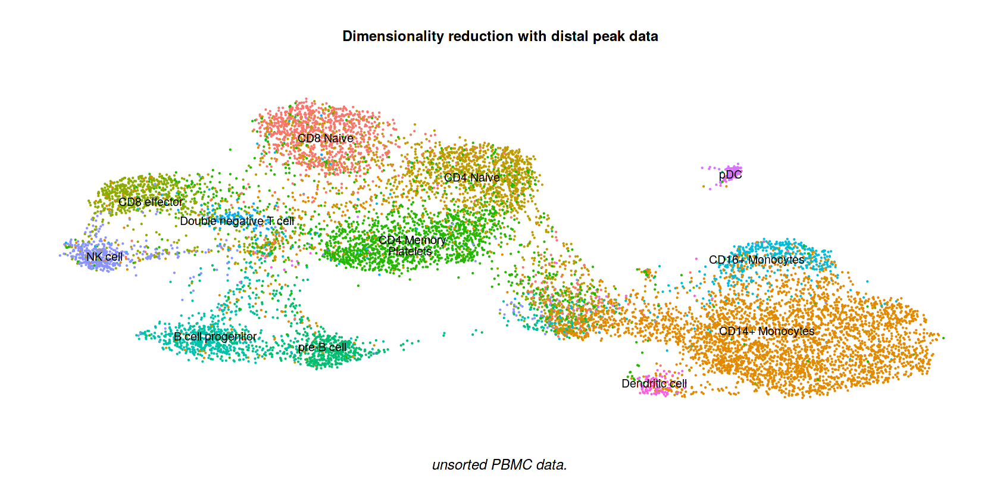

In [88]:
suppressWarnings({
    DefaultAssay(unsortedSeurat) <- "ATAC_distal"
    unsortedSeurat <- RunSVD(unsortedSeurat, n = Ku, verbose = FALSE)
    unsortedSeurat <- RunUMAP(unsortedSeurat, reduction = 'lsi', dims = 1:Ku, verbose = FALSE)
    plot <- DimPlot(unsortedSeurat, label = TRUE, reduction="umap") + 
      NoLegend() + NoAxes() + scale_fill_manual(values=colors)
    title   <- ggdraw() + draw_label(
        "Dimensionality reduction with distal peak data",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "unsorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
})

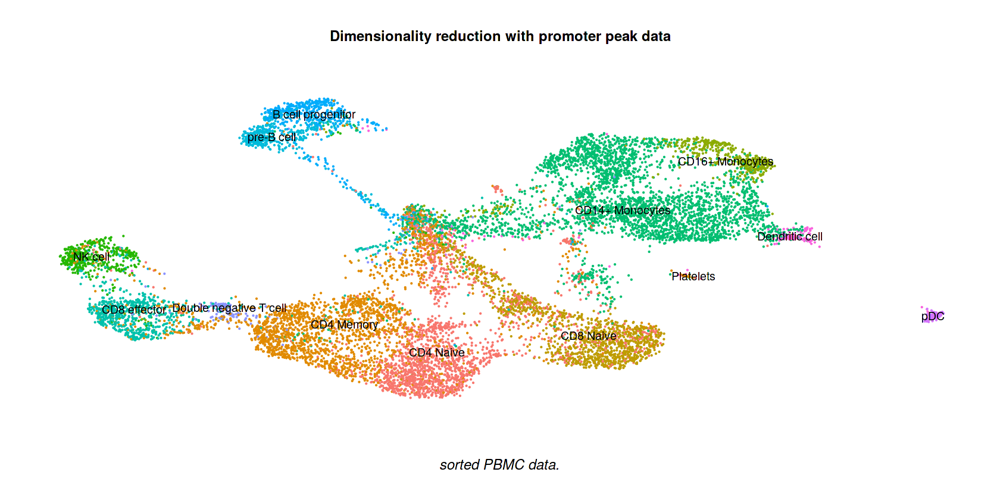

In [89]:
suppressWarnings({
    DefaultAssay(sortedSeurat) <- "ATAC_promoter"
    sortedSeurat <- RunSVD(sortedSeurat, n = Ks, verbose = FALSE)
    sortedSeurat <- RunUMAP(sortedSeurat, reduction = 'lsi', dims = 1:Ks, verbose = FALSE)
    plot <- DimPlot(sortedSeurat, label = TRUE, reduction="umap") + 
      NoLegend() + NoAxes() + scale_fill_manual(values=colors)
    title   <- ggdraw() + draw_label(
        "Dimensionality reduction with promoter peak data",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "sorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
})

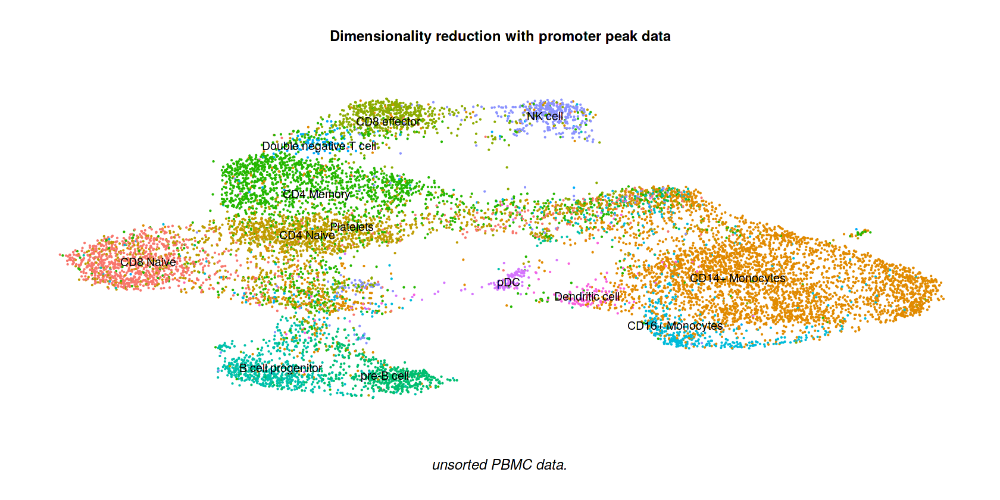

In [87]:
suppressWarnings({
    DefaultAssay(unsortedSeurat) <- "ATAC_promoter"
    unsortedSeurat <- RunSVD(unsortedSeurat, n = Ku, verbose = FALSE)
    unsortedSeurat <- RunUMAP(unsortedSeurat, reduction = 'lsi', dims = 1:Ku, verbose = FALSE)
    plot <- DimPlot(unsortedSeurat, label = TRUE, reduction="umap") + 
      NoLegend() + NoAxes() + scale_fill_manual(values=colors)
    title   <- ggdraw() + draw_label(
        "Dimensionality reduction with promoter peak data",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "unsorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))
})

In [33]:
msgidb.matrix <- msigdbr(
  species = "Homo sapiens",
  category = "C5", 
  subcategory = "BP"
  ) %>% as.data.table %>% .[,id:=1] %>%
  dcast(gs_name~gene_symbol, value.var="id", fill=0) # %>% 
  # as.matrix()

In [49]:
msgidb.mat <- msgidb.matrix %>% as.data.table %>% .[,id:=1] %>%
  dcast(gs_name~gene_symbol, value.var="id", fill=0)
str(msgidb.mat)

Classes 'data.table' and 'data.frame':	7573 obs. of  17902 variables:
 $ gs_name         : chr  "GO_10_FORMYLTETRAHYDROFOLATE_METABOLIC_PROCESS" "GO_2FE_2S_CLUSTER_ASSEMBLY" "GO_2_OXOGLUTARATE_METABOLIC_PROCESS" "GO_3_PHOSPHOADENOSINE_5_PHOSPHOSULFATE_BIOSYNTHETIC_PROCESS" ...
 $ A1BG            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A1CF            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A2M             : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A2ML1           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A3GALT2         : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A4GALT          : num  0 0 0 0 0 0 0 0 0 0 ...
 $ A4GNT           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AAAS            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AACS            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AADAC           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AADAT           : num  0 0 1 0 0 0 0 0 0 0 ...
 $ AAK1            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AAMDC           : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AAMP            : num  0 0 0 0 0 0 0 0 0 0 ...
 $ AANAT           : n

In [50]:
# GSEA on positive weights
gsea.positive <- run_enrichment(sortedMOFA, 
  feature.sets = msgidb.mat, 
  view = "RNA",
  sign = "positive"
)

# GSEA on negative weights
gsea.negative <- run_enrichment(sortedMOFA, 
  feature.sets = msgidb.mat, 
  view = "RNA",
  sign = "negative"
)

ERROR: Error in run_enrichment(sortedMOFA, feature.sets = msgidb.mat, view = "RNA", : feature.sets has to be a list or a binary matrix.


In [51]:
names(gsea.positive)

ERROR: Error in eval(expr, envir, enclos): object 'gsea.positive' not found


In [ ]:
plot_enrichment(gsea.positive, factor = 1, max.pathways = 15)

In [ ]:
plot_enrichment(gsea.negative, factor = 1, max.pathways = 15)

In [ ]:
plot_enrichment_detailed(gsea.positive,
  factor = 1,
  max.genes = 10,
  max.pathways = 5
)

In [92]:
# define motif matrix
sorted.motif.matrix <- t(as.matrix(sortedSeurat[["ATAC_distal"]]@motifs@data))

# Run GSEA enrichment analysis using the motif-peak matrix, (+) weights
sorted.motif.enrichment.positive <- run_enrichment(sortedMOFA,
  view = "ATAC_distal", 
  factors = 4,
  feature.sets = sorted.motif.matrix,
  sign = "positive"
)

# Run GSEA enrichment analysis using the motif-peak matrix, (-) weights
sorted.motif.enrichment.negative <- run_enrichment(sortedMOFA,
  view = "ATAC_distal", 
  factors = 4,
  feature.sets = sorted.motif.matrix,
  sign = "negative"
)

# define motif matrix
unsorted.motif.matrix <- t(as.matrix(unsortedSeurat[["ATAC_distal"]]@motifs@data))

# Run GSEA enrichment analysis using the motif-peak matrix, (+) weights
unsorted.motif.enrichment.positive <- run_enrichment(unsortedMOFA,
  view = "ATAC_distal", 
  factors = 4,
  feature.sets = unsorted.motif.matrix,
  sign = "positive"
)

# Run GSEA enrichment analysis using the motif-peak matrix, (-) weights
unsorted.motif.enrichment.negative <- run_enrichment(unsortedMOFA,
  view = "ATAC_distal", 
  factors = 4,
  feature.sets = unsorted.motif.matrix,
  sign = "negative"
)

Intersecting features names in the model and the gene set annotation results in a total of 9872 features.


Running feature set Enrichment Analysis with the following options...
View: ATAC_distal 
Number of feature sets: 633 
Set statistic: mean.diff 
Statistical test: parametric 


Subsetting weights with positive sign




Intersecting features names in the model and the gene set annotation results in a total of 9872 features.


Running feature set Enrichment Analysis with the following options...
View: ATAC_distal 
Number of feature sets: 633 
Set statistic: mean.diff 
Statistical test: parametric 


Subsetting weights with negative sign




Intersecting features names in the model and the gene set annotation results in a total of 5700 features.


Running feature set Enrichment Analysis with the following options...
View: ATAC_distal 
Number of feature sets: 633 
Set statistic: mean.diff 
Statistical test: parametric 


Subsetting weights with positive sign




Intersecting features 

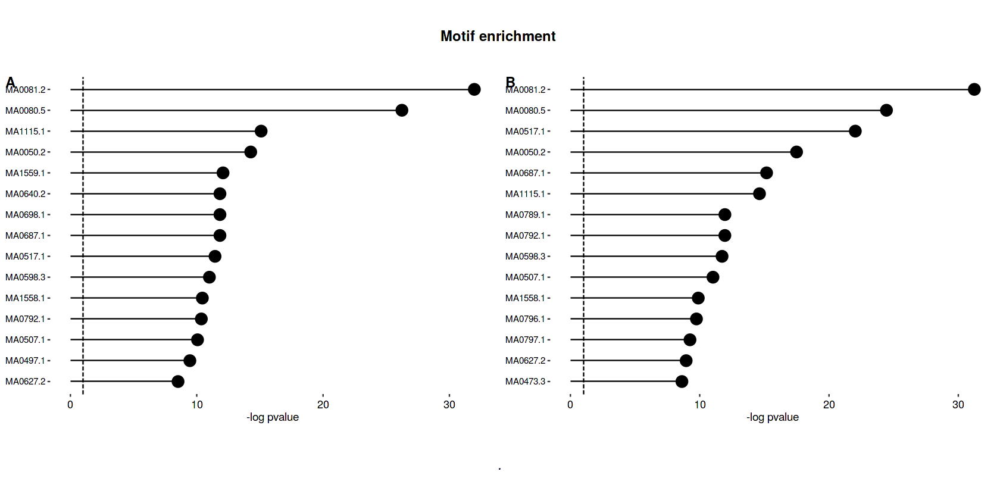

In [100]:
a <- plot_enrichment(sorted.motif.enrichment.positive,   factor = 1, max.pathways = 15)
b <- plot_enrichment(unsorted.motif.enrichment.positive, factor = 1, max.pathways = 15)


    plot    <- cowplot::plot_grid(a, b, labels="AUTO")
    title   <- ggdraw() + draw_label(
        "Positively enriched motifs for factor 4",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "A) sorted PBMC data. B) unsorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))

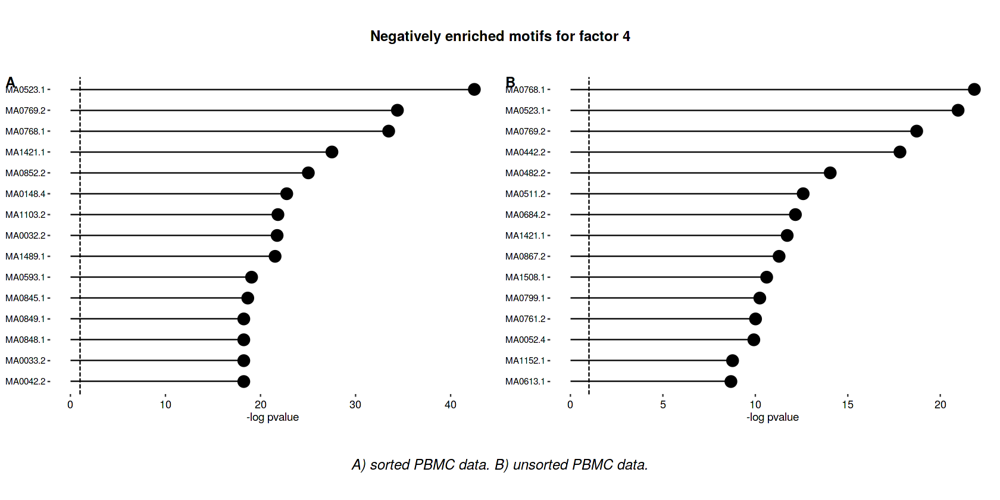

In [101]:
a <- plot_enrichment(sorted.motif.enrichment.negative,   factor = 1, max.pathways = 15)
b <- plot_enrichment(unsorted.motif.enrichment.negative, factor = 1, max.pathways = 15)


    plot    <- cowplot::plot_grid(a, b, labels="AUTO")
    title   <- ggdraw() + draw_label(
        "Negatively enriched motifs for factor 4",
        fontface = 'bold') 

    caption <- ggdraw() + draw_label(
        "A) sorted PBMC data. B) unsorted PBMC data.",
        fontface = 'italic') 

    cowplot::plot_grid(title, plot, caption, ncol = 1, rel_heights = c(0.2, 1, 0.2))

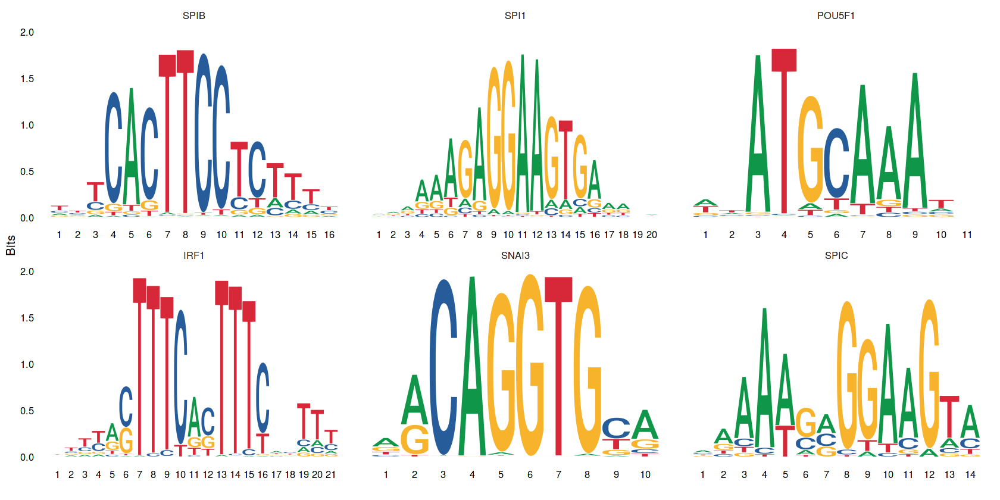

In [103]:
sorted.sig.motifs.positive <- sorted.motif.enrichment.positive$pval.adj[,"Factor4"] %>%
  sort %>% head(n=6) %>% names
MotifPlot(sortedSeurat[["ATAC_distal"]], motifs = sorted.sig.motifs.positive)

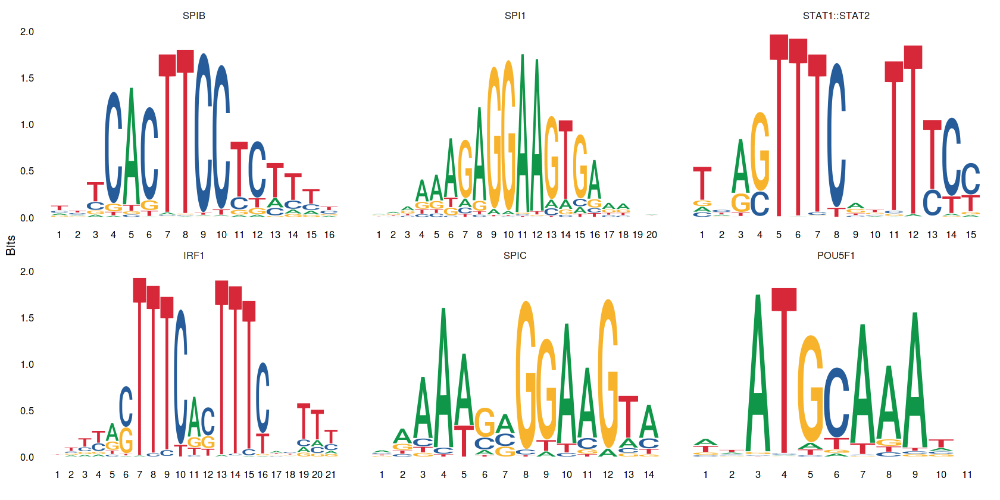

In [104]:
unsorted.sig.motifs.positive <- unsorted.motif.enrichment.positive$pval.adj[,"Factor4"] %>%
  sort %>% head(n=6) %>% names
MotifPlot(unsortedSeurat[["ATAC_distal"]], motifs = unsorted.sig.motifs.positive)

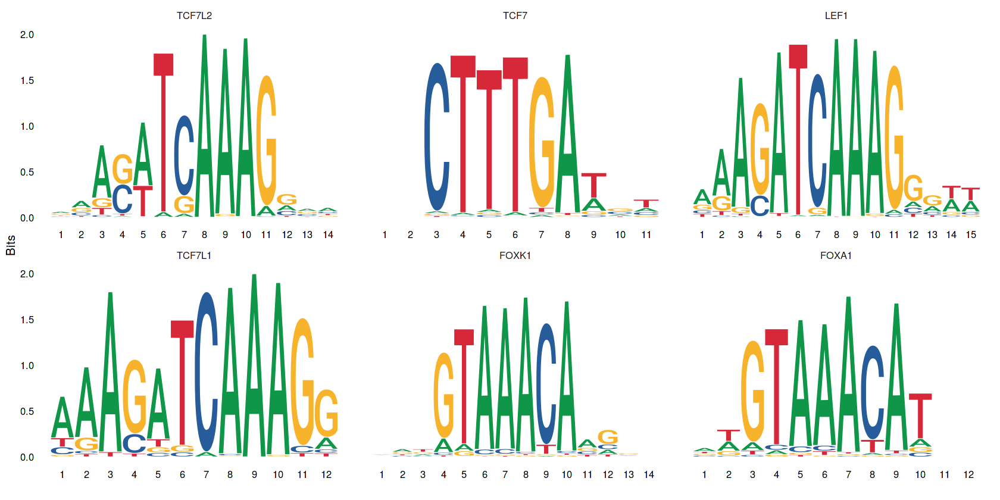

In [106]:
sorted.sig.motifs.negative <- sorted.motif.enrichment.negative$pval.adj[,"Factor4"] %>%
  sort %>% head(n=6) %>% names
MotifPlot(sortedSeurat[["ATAC_distal"]], motifs = sorted.sig.motifs.negative)

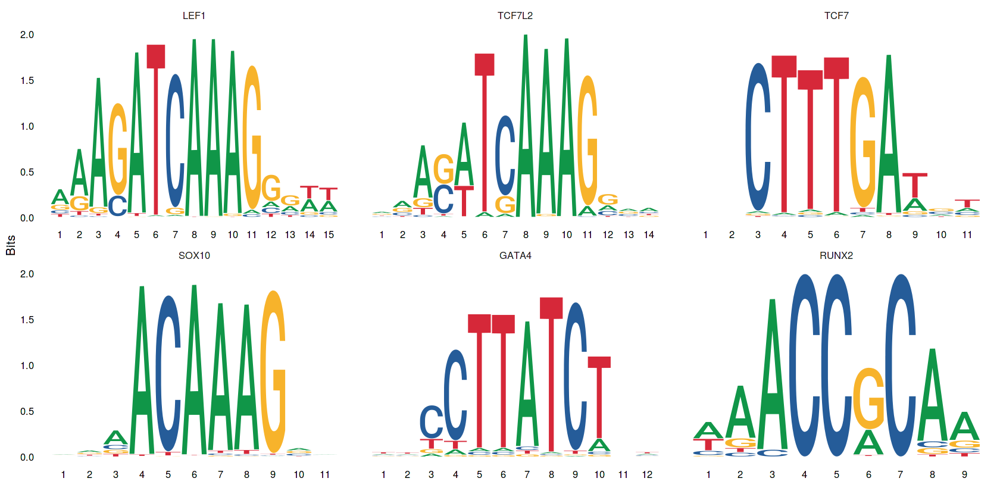

In [105]:
unsorted.sig.motifs.negative <- unsorted.motif.enrichment.negative$pval.adj[,"Factor4"] %>%
  sort %>% head(n=6) %>% names
MotifPlot(unsortedSeurat[["ATAC_distal"]], motifs = unsorted.sig.motifs.negative)

In [6]:

seurat <- Signac::RunChromVAR(
  object = sortedSeurat, 
  assay = "ATAC_distal",
  genome = BSgenome.Hsapiens.UCSC.hg38, 
  new.assay.name = "chromvar"
)

DefaultAssay(sortedSeurat) <- "chromvar"

Registered S3 method overwritten by 'spatstat':
  method     from
  print.boxx cli 

Warning message in get0(oNam, envir = ns):
“internal error -3 in R_decompress1”


ERROR: Error: .onLoad failed in loadNamespace() for 'checkmate', details:
  call: get0(oNam, envir = ns)
  error: lazy-load database '/usr/local/lib/R/site-library/backports/R/backports.rdb' is corrupt


In [3]:
BiocManager::install("GreenleafLab/chromVAR")

Bioconductor version 3.12 (BiocManager 1.30.10), R 4.0.3 (2020-10-10)

Installing github package(s) 'GreenleafLab/chromVAR'




BiocParallel (1.24.0 -> 1.24.1) [CRAN]
R6           (2.4.1  -> 2.5.0 ) [CRAN]
digest       (0.6.25 -> 0.6.27) [CRAN]
generics     (0.0.2  -> 0.1.0 ) [CRAN]
cpp11        (0.2.3  -> 0.2.4 ) [CRAN]
backports    (1.1.10 -> 1.2.0 ) [CRAN]
diffobj      (NA     -> 0.3.2 ) [CRAN]
rstudioapi   (0.11   -> 0.12  ) [CRAN]
waldo        (NA     -> 0.2.3 ) [CRAN]
brio         (NA     -> 1.1.0 ) [CRAN]
colorspace   (1.4-1  -> 2.0-0 ) [CRAN]
labeling     (0.3    -> 0.4.2 ) [CRAN]
testthat     (2.3.2  -> 3.0.0 ) [CRAN]
nabor        (NA     -> 0.5.0 ) [CRAN]


Installing 14 packages: BiocParallel, R6, digest, generics, cpp11, backports, diffobj, rstudioapi, waldo, brio, colorspace, labeling, testthat, nabor



✔  checking for file ‘/tmp/Rtmptd3t2X/remotesa7225dce/GreenleafLab-chromVAR-0f27fcc/DESCRIPTION’
─  preparing ‘chromVAR’:
✔  checking DESCRIPTION meta-information
─  cleaning src
─  checking for LF line-endings in source and make files and shell scripts
─  checking for empty or unneeded directories
─  building ‘chromVAR_1.5.0.tar.gz’
   


Installation path not writeable, unable to update packages: codetools,
  KernSmooth, nlme

Old packages: 'chromVAR', 'deldir', 'HDF5Array', 'leiden', 'MOFA2',
  'patchwork', 'reticulate', 'rhdf5', 'Rhdf5lib', 'Signac', 'xfun'



In [58]:
motifs.to.plot <- c(sig.motifs.positive[1:2], sig.motifs.negative[1:2])

FeaturePlot(sortedSeurat,
  features = motifs.to.plot,
  reduction = "umap",
  combine = TRUE
) & NoLegend() & NoAxes()

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
"The following requested variables were not found: MA1636.1, MA0102.4, MA0523.1, MA0768.1"


ERROR: Error: None of the requested features were found: MA1636.1, MA0102.4, MA0523.1, MA0768.1 in slot data


In [107]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-pc-linux-gnu (64-bit)
Running under: Debian GNU/Linux bullseye/sid

Matrix products: default
BLAS:   /usr/lib/x86_64-linux-gnu/openblas-pthread/libblas.so.3
LAPACK: /usr/lib/x86_64-linux-gnu/openblas-pthread/libopenblasp-r0.3.10.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] psych_2.0.9         magrittr_1.5        ggbio_1.38.0       
 [4] BiocGenerics_0.36.0 msigdbr_7.2.1       ggpubr_0.4.0       
 [7] Signac_1.0.0        Seurat_3.2.2        reticulate_1.16    
[10] purrr_0.3.4         